In [1]:
%matplotlib inline 
import matplotlib.pyplot as plt

import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'
#os.environ['HDF5_DISABLE_VERSION_CHECK']='True'

import pandas as pd

import numpy as np

from scipy import stats
from scipy.stats import percentileofscore
from scipy.stats import ttest_ind

from tqdm.notebook import tqdm
import os

import warnings
warnings.filterwarnings("ignore")

dv = 'REACTION_TIME'  # options {'percentile', 'REACTION_TIME'}


### Qauntify the strength of the object-centric signal for each model 

In [2]:
run_names_dict = {'imagenet_resnet50_test': 'imagenet_resnet50',
                  'dino_resnet50_test': 'dino_resnet50',
                  'mae_vit_base_test_16_k': 'mae_vitb16_key', 
                  'mae_vit_base_test_16_v': 'mae_vitb16_value', 
                  'mae_vit_base_test_16_q': 'mae_vitb16_query', 
                  'vit_base_test_16_k': 'dino_vitb16_key',
                  'vit_base_test_16_v': 'dino_vitb16_value', 
                  'vit_base_test_16_q': 'dino_vitb16_query', 
                  'vit_base_test_8_k': 'dino_vitb8_key', 
                  'vit_base_test_8_v': 'dino_vitb8_value', 
                  'vit_base_test_8_q': 'dino_vitb8_query',
                  'dinov2_vitb14_test_14_k': 'dinov2_vitb14_key', 
                  'dinov2_vitb14_test_14_v': 'dinov2_vitb14_value',
                  'dinov2_vitb14_test_14_q': 'dinov2_vitb14_query',
                  'dinov2_vitl14_test_14_k': 'dinov2_vitl14_key', 
                  'dinov2_vitl14_test_14_v': 'dinov2_vitl14_value', 
                  'dinov2_vitl14_test_14_q': 'dinov2_vitl14_query', 
                  'dinov2_vitg14_test_14_k': 'dinov2_vitg14_key', 
                  'dinov2_vitg14_test_14_v': 'dinov2_vitg14_value', 
                  'dinov2_vitg14_test_14_q': 'dinov2_vitg14_query',
                  
                 }

color_dict={'imagenet_resnet50_test': 'palegreen', #steelblue
            'dino_resnet50_test': 'darkviolet',
            'mae_vit_base_test_16_k': 'green',  #green
            'mae_vit_base_test_16_v': 'olive',  #red
            'mae_vit_base_test_16_q': 'limegreen',  #red
            'vit_base_test_16_k': 'lightpink', #lightpurple
            'vit_base_test_16_v': 'crimson', #cyan
            'vit_base_test_16_q': 'orchid', #cyan
            'vit_base_test_8_k': 'lightsteelblue', 
            'vit_base_test_8_v': 'slategray', 
            'vit_base_test_8_q': 'cyan', 
            'dinov2_vitb14_test_14_k': 'deepskyblue', # steelblue
            'dinov2_vitb14_test_14_v': 'lavender', #palepink
            'dinov2_vitb14_test_14_q': 'steelblue', #palepink
            'dinov2_vitl14_test_14_k': 'orange', # orange
            'dinov2_vitl14_test_14_v': 'palegoldenrod', #dark gray
            'dinov2_vitl14_test_14_q': 'gold', #dark gray
            'dinov2_vitg14_test_14_k': 'tomato', # brown
            'dinov2_vitg14_test_14_v': 'red', #yellowgreen
            'dinov2_vitg14_test_14_q': 'brown', #yellowgreen
             }

color_dict_simple ={'imagenet_resnet50_test': 'palegreen', #steelblue
                    'dino_resnet50_test': 'darkviolet',
                    'mae_vit_base_test_16_k': 'green',  #green
                    'mae_vit_base_test_16_v': 'green',  #red
                    'mae_vit_base_test_16_q': 'green',  #red
                    'vit_base_test_16_k': 'lightpink', #lightpurple
                    'vit_base_test_16_v': 'lightpink', #cyan
                    'vit_base_test_16_q': 'lightpink', #cyan
                    'vit_base_test_8_k': 'lightsteelblue', 
                    'vit_base_test_8_v': 'lightsteelblue', 
                    'vit_base_test_8_q': 'lightsteelblue', 
                    'dinov2_vitb14_test_14_k': 'steelblue', # steelblue
                    'dinov2_vitb14_test_14_v': 'steelblue', #palepink
                    'dinov2_vitb14_test_14_q': 'steelblue', #palepink
                    'dinov2_vitl14_test_14_k': 'orange', # orange
                    'dinov2_vitl14_test_14_v': 'orange', #dark gray
                    'dinov2_vitl14_test_14_q': 'orange', #dark gray
                    'dinov2_vitg14_test_14_k': 'brown', # brown
                    'dinov2_vitg14_test_14_v': 'brown', #yellowgreen
                    'dinov2_vitg14_test_14_q': 'brown', #yellowgreen
             }

run_names_dict_abb = {  'imagenet_resnet50_test': 'ImageNet_ResNet50',
                        'dino_resnet50_test': 'DINO_ResNet50',
                        'mae_vit_base_test_16_k': 'MAE_ViTb16', 
                        'mae_vit_base_test_16_v': 'MAE_ViTb16', 
                        'mae_vit_base_test_16_q': 'MAE_ViTb16',
                        'vit_base_test_16_k': 'DINO_ViTb16',
                        'vit_base_test_16_v': 'DINO_ViTb16', 
                        'vit_base_test_16_q': 'DINO_ViTb16',
                        'vit_base_test_8_k': 'DINO_ViTb8', 
                        'vit_base_test_8_v': 'DINO_ViTb8', 
                        'vit_base_test_8_q': 'DINO_ViTb8', 
                        'dinov2_vitb14_test_14_k': 'DINOv2_ViTb14', 
                        'dinov2_vitb14_test_14_v': 'DINOv2_ViTb14',
                        'dinov2_vitb14_test_14_q': 'DINOv2_ViTb14', 
                        'dinov2_vitl14_test_14_k': 'DINOv2_ViTl14', 
                        'dinov2_vitl14_test_14_v': 'DINOv2_ViTl14', 
                        'dinov2_vitl14_test_14_q': 'DINOv2_ViTl14', 
                        'dinov2_vitg14_test_14_k': 'DINOv2_ViTg14', 
                        'dinov2_vitg14_test_14_v': 'DINOv2_ViTg14', 
                        'dinov2_vitg14_test_14_q': 'DINOv2_ViTg14', 

                    }

colors = list(color_dict.values())
colors_simple = list(color_dict_simple.values())
model_names = list(run_names_dict_abb.values())

In [3]:
df_res = pd.DataFrame(run_names_dict.items(), columns=['roc_run_name', 'run_name'])
df_res['color'] = colors
df_res['color_simple'] = colors_simple
df_res['model_name'] = model_names
df_res

,roc_run_name,run_name,color,color_simple,model_name
0,imagenet_resnet50_test,imagenet_resnet50,palegreen,palegreen,ImageNet_ResNet50
1,dino_resnet50_test,dino_resnet50,darkviolet,darkviolet,DINO_ResNet50
2,mae_vit_base_test_16_k,mae_vitb16_key,green,green,MAE_ViTb16
3,mae_vit_base_test_16_v,mae_vitb16_value,olive,green,MAE_ViTb16
4,mae_vit_base_test_16_q,mae_vitb16_query,limegreen,green,MAE_ViTb16
5,vit_base_test_16_k,dino_vitb16_key,lightpink,lightpink,DINO_ViTb16
6,vit_base_test_16_v,dino_vitb16_value,crimson,lightpink,DINO_ViTb16
7,vit_base_test_16_q,dino_vitb16_query,orchid,lightpink,DINO_ViTb16
8,vit_base_test_8_k,dino_vitb8_key,lightsteelblue,lightsteelblue,DINO_ViTb8
9,vit_base_test_8_v,dino_vitb8_value,slategray,lightsteelblue,DINO_ViTb8


In [4]:
from sklearn import metrics

ROCs_dir = './outputs/grouping/ROCs/'
file_names = os.listdir(ROCs_dir)
run_names = []
run_ROCs = []

auc_dict = {}

for file_name in file_names:
    
    if 'ipynb' in file_name:
        continue
    ROC_data = np.load(ROCs_dir+file_name).mean(0)
    tpr = ROC_data[0]
    fpr = ROC_data[1]
    
    run_names.append(file_name)
    area_under_ROC = metrics.auc(fpr, tpr)
    run_ROCs.append(area_under_ROC) 
    
    auc_dict[file_name.split('.')[0]] = area_under_ROC
    
    print(file_name, area_under_ROC)

    
df_res = pd.merge(df_res, pd.DataFrame(auc_dict.items(), columns=['roc_run_name', 'auc_roc']), on='roc_run_name')
df_res_sorted = df_res.sort_values(by=['auc_roc'], ascending=False)
# df_res_sorted = df_res.groupby(['model_name'], as_index=False).max().sort_values(by=['auc_roc'], ascending=False)
# df_res_sorted

dinov2_vitl14_test_14_v.npy 0.784809887390008
dinov2_vitg14_test_14_q.npy 0.8386150801789136
dinov2_vitl14_test_14_q.npy 0.8537754807357478
imagenet_resnet50_test.npy 0.6111764279591292
vit_base_test_8_k.npy 0.7683779504261626
dinov2_vitg14_test_14_v.npy 0.7682883818681058
mae_vit_base_test_16_v.npy 0.8158372136004509
mae_vit_base_test_16_k.npy 0.8400340909790036
dinov2_vitb14_test_14_k.npy 0.870257282037733
dinov2_vitb14_test_14_q.npy 0.8770734580870714
vit_base_test_8_q.npy 0.7850535736444344
vit_base_test_16_k.npy 0.7967316063050414
vit_base_test_8_v.npy 0.7908676876843924
mae_vit_base_test_16_q.npy 0.8477031931599583
dinov2_vitg14_test_14_k.npy 0.8065995168621118
vit_base_test_16_q.npy 0.7966394324364781
vit_base_test_16_v.npy 0.7858530640329012
dinov2_vitl14_test_14_k.npy 0.8557333335267299
dinov2_vitb14_test_14_v.npy 0.7691072753784444
dino_resnet50_test.npy 0.6182340354643514


In [5]:
df_res_sorted

,roc_run_name,run_name,color,color_simple,model_name,auc_roc
13,dinov2_vitb14_test_14_q,dinov2_vitb14_query,steelblue,steelblue,DINOv2_ViTb14,0.877073
11,dinov2_vitb14_test_14_k,dinov2_vitb14_key,deepskyblue,steelblue,DINOv2_ViTb14,0.870257
14,dinov2_vitl14_test_14_k,dinov2_vitl14_key,orange,orange,DINOv2_ViTl14,0.855733
16,dinov2_vitl14_test_14_q,dinov2_vitl14_query,gold,orange,DINOv2_ViTl14,0.853775
4,mae_vit_base_test_16_q,mae_vitb16_query,limegreen,green,MAE_ViTb16,0.847703
2,mae_vit_base_test_16_k,mae_vitb16_key,green,green,MAE_ViTb16,0.840034
19,dinov2_vitg14_test_14_q,dinov2_vitg14_query,brown,brown,DINOv2_ViTg14,0.838615
3,mae_vit_base_test_16_v,mae_vitb16_value,olive,green,MAE_ViTb16,0.815837
17,dinov2_vitg14_test_14_k,dinov2_vitg14_key,tomato,brown,DINOv2_ViTg14,0.806600
5,vit_base_test_16_k,dino_vitb16_key,lightpink,lightpink,DINO_ViTb16,0.796732


dinov2_vitb14_query
dinov2_vitb14_key
dinov2_vitl14_key
dinov2_vitl14_query
mae_vitb16_query
mae_vitb16_key
dinov2_vitg14_query
mae_vitb16_value
dinov2_vitg14_key
dino_vitb16_key
dino_vitb16_query
dino_vitb8_value
dino_vitb16_value
dino_vitb8_query
dinov2_vitl14_value
dinov2_vitb14_value
dino_vitb8_key
dinov2_vitg14_value
dino_resnet50
imagenet_resnet50


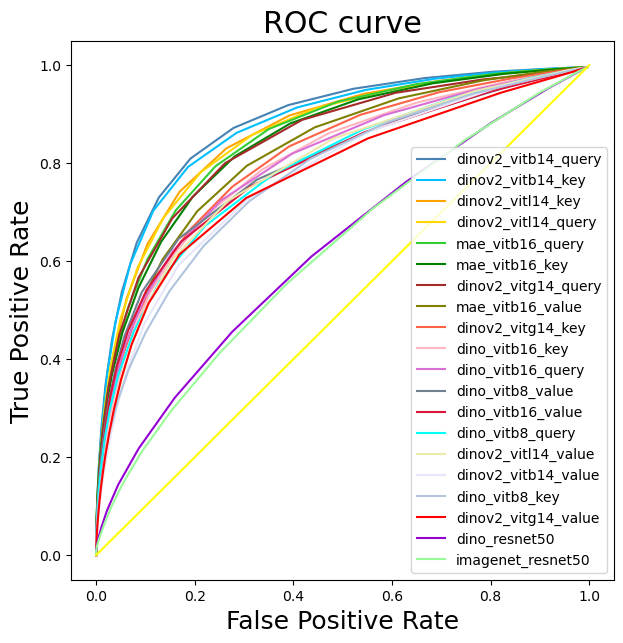

In [6]:

# fig = plt.figure(figsize=(7, 7))
# gs = fig.add_gridspec(1,1)

# ax = plt.subplot(gs[0,0])

fig, ax = plt.subplots(figsize=(7, 7))

tetas = 1 - np.arange(0,21)/20
for run_name in df_res_sorted['run_name'].unique():
   
    df_res_run = df_res[df_res['run_name']==run_name]  #.sort_values(by=['auc_roc'], ascending=False)
    
    label = run_name
    color = df_res_run['color'].iloc[0]
    print(run_name)
    
    ROC_data = np.load(ROCs_dir+(df_res_run['roc_run_name'].iloc[0] + '.npy')).mean(0)
    ax.plot(ROC_data[1], ROC_data[0], label=label, color=color)
    
plt.rcParams.update({'font.size': 18})
ax.set_title('ROC curve')
ax.set_ylabel('True Positive Rate', fontsize=18)
ax.set_xlabel('False Positive Rate', fontsize=18)
plt.axis('on')
ax.plot(tetas, tetas, 'yellow')
ax.legend(fontsize=10)
plt.show()

fig.savefig("figures/ROC_curve_all_sorted.png", bbox_inches='tight', dpi=300)

dinov2_vitb14_test_14_q.npy
dinov2_vitl14_test_14_k.npy
mae_vit_base_test_16_q.npy
dinov2_vitg14_test_14_q.npy
vit_base_test_16_k.npy
vit_base_test_8_v.npy
dino_resnet50_test.npy
imagenet_resnet50_test.npy


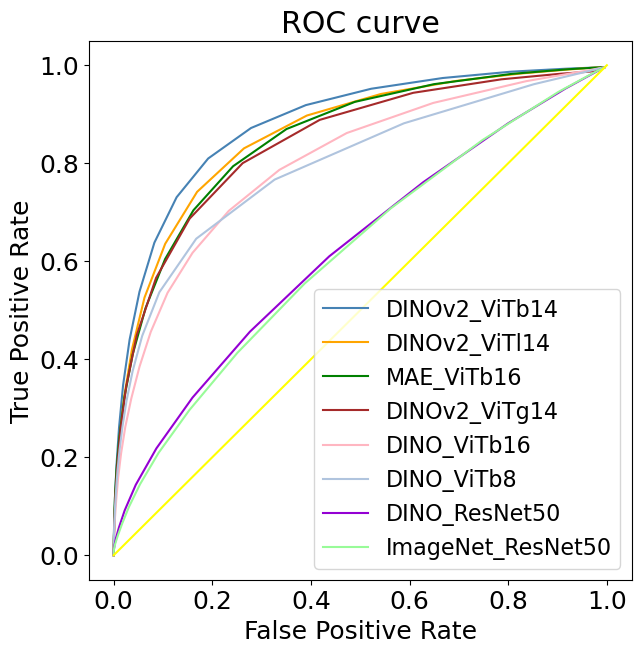

In [7]:

# fig = plt.figure(figsize=(7, 7))
# gs = fig.add_gridspec(1,1)

# ax = plt.subplot(gs[0,0])

fig, ax = plt.subplots(figsize=(7, 7))

tetas = 1 - np.arange(0,21)/20
for model_name in df_res_sorted['model_name'].unique():
   
    df_res_run = df_res[df_res['model_name']==model_name].sort_values(by=['auc_roc'], ascending=False)
    
    run_name = df_res_run['roc_run_name'].iloc[0] + '.npy'
    label = model_name
    color = df_res_run['color_simple'].iloc[0]
    print(run_name)
    
    ROC_data = np.load(ROCs_dir+run_name).mean(0)
    ax.plot(ROC_data[1], ROC_data[0], label=label, color=color)
    
plt.rcParams.update({'font.size': 18})
ax.set_title('ROC curve')
ax.set_ylabel('True Positive Rate', fontsize=18)
ax.set_xlabel('False Positive Rate', fontsize=18)
plt.axis('on')
ax.plot(tetas, tetas, 'yellow')
ax.legend(fontsize=16)
plt.show()

fig.savefig("figures/ROC_curve_sorted.png", bbox_inches='tight', dpi=300)

## read in the model predictions and calculate accuracy and correlation with subjects

In [8]:
model_restuls_dir = './outputs/grouping/model_att_steps/' 
file_names = np.sort(os.listdir(model_restuls_dir))

In [9]:

# def load_model_results():
    
def model_acc(df_comp):
    acc = []
    for max_steps in range(0,21):
        hit = len(df_comp[(df_comp['same_diff']=='same') & (df_comp['model_pred']<max_steps)])
        miss = len(df_comp[(df_comp['same_diff']=='same') & (df_comp['model_pred']>=max_steps)])
        fp = len(df_comp[(df_comp['same_diff']=='diff') & (df_comp['model_pred']<max_steps)])
        tn = len(df_comp[(df_comp['same_diff']=='diff') & (df_comp['model_pred']>=max_steps)])

        #print(f'hit: {hit}  miss: {miss}  false positive: {fp}  true negative: {tn}')

        acc.append((hit+tn) / 1024)
    
    acc = np.array(acc)
    return np.max(acc), np.argmax(acc)

def model_beh_corr(df_comp, dv):
    
#     split_corr = stats.spearmanr(df_comp['subs_mean_p'], df_comp['distance'])
    split_corr = stats.spearmanr(df_comp[dv], df_comp['model_pred'])

#     df_comp_same = df_comp[(df_comp['same_diff'] == 'same') ]  #& (df_comp['model_pred']<30)
#     #df_comp_same = df_comp_same[df_comp_same['model_pred'] <21 ]

#     split_corr = stats.spearmanr(df_comp_same['subs_mean_p'], df_comp_same['distance'])
#     split_corr = stats.spearmanr(df_comp_same['subs_mean_p'], df_comp_same['model_pred'])
    
    return split_corr[0]
    

In [10]:
df_test = pd.read_excel("./datasets/dataset_grouping/test_data_grouping_with_mean_beh.xls", index_col=0)  

model_restuls_dir = './outputs/grouping/model_att_steps/' 
file_names = np.sort(os.listdir(model_restuls_dir))
all_acc = []
all_corr = []
exp_names = []

acc_dict = dict([(i,0) for i in df_res['roc_run_name']])

corr_dict =  acc_dict.copy()

dv = 'REACTION_TIME'  # options {'percentile', 'REACTION_TIME'}

for exp_name in file_names:
    
    df_comp = df_test.copy()
    
    if 'ipynb' in exp_name:
        continue
        
    exp_names.append(exp_name)
    model_preds = np.load(model_restuls_dir + exp_name) 
    df_comp['model_pred'] = list(model_preds)
    
    run_name = '_'.join(exp_name.split('_')[:-2])
    #run_name = df_res[df_res['roc_run_name'] == run_name]['model_name'].iloc[0]
    
    acc = acc_dict[run_name]
    corr = corr_dict[run_name]

    max_acc, max_acc_step = model_acc(df_comp)
    
    all_acc.append(max_acc)
    
    if dv == 'REACTION_TIME':
        sm_corr = model_beh_corr(df_comp, 'subs_mean_rt')
    elif dv == 'percentile':
        sm_corr = model_beh_corr(df_comp, 'subs_mean_p')
    
    all_corr.append(sm_corr)
    if max_acc > acc_dict[run_name]:
        acc_dict[run_name] = max_acc
        corr_dict[run_name] = sm_corr
        

In [11]:
if 'model_acc' not in df_res.columns:
    df_res = pd.merge(df_res, pd.DataFrame(acc_dict.items(), columns=['roc_run_name', 'model_acc']), on='roc_run_name')
else:
    df_res['model_acc'] = list(acc_dict.values())
    
if 'model_human_corr' not in df_res.columns:
    df_res = pd.merge(df_res, pd.DataFrame(corr_dict.items(), columns=['roc_run_name', 'model_human_corr']), on='roc_run_name')
else:
    df_res['model_human_corr'] = list(corr_dict.values())

# df_res_sorted = df_res.sort_values(by=['auc_roc'], ascending=False)

In [14]:
df_res

,roc_run_name,run_name,color,color_simple,model_name,auc_roc,model_acc,model_human_corr
0,imagenet_resnet50_test,imagenet_resnet50,palegreen,palegreen,ImageNet_ResNet50,0.611176,0.536133,0.102727
1,dino_resnet50_test,dino_resnet50,darkviolet,darkviolet,DINO_ResNet50,0.618234,0.536133,0.116228
2,mae_vit_base_test_16_k,mae_vitb16_key,green,green,MAE_ViTb16,0.840034,0.722656,0.218501
3,mae_vit_base_test_16_v,mae_vitb16_value,olive,green,MAE_ViTb16,0.815837,0.711914,0.217418
4,mae_vit_base_test_16_q,mae_vitb16_query,limegreen,green,MAE_ViTb16,0.847703,0.734375,0.234090
5,vit_base_test_16_k,dino_vitb16_key,lightpink,lightpink,DINO_ViTb16,0.796732,0.713867,0.201351
6,vit_base_test_16_v,dino_vitb16_value,crimson,lightpink,DINO_ViTb16,0.785853,0.705078,0.212488
7,vit_base_test_16_q,dino_vitb16_query,orchid,lightpink,DINO_ViTb16,0.796639,0.702148,0.214559
8,vit_base_test_8_k,dino_vitb8_key,lightsteelblue,lightsteelblue,DINO_ViTb8,0.768378,0.728516,0.186903
9,vit_base_test_8_v,dino_vitb8_value,slategray,lightsteelblue,DINO_ViTb8,0.790868,0.750000,0.226669


In [15]:
sub_sub_corr = 0.417
sub_acc = 0.9

split_corr = stats.spearmanr(df_test['subs_mean_p'], df_test['distance'])
distance_model_corr = split_corr[0]
distance_acc = 0.5

#df_res.loc[len(df_res.index)] = ['subject','subject-subject', 'black','subject-subject', 0, sub_acc, sub_sub_corr] 

if 'distance' not in df_res['roc_run_name'].unique():
    df_res.loc[len(df_res.index)] = ['distance','Euclidean', 'gray', 'gray','Euclidean', 0, distance_acc, distance_model_corr] 

df_res

,roc_run_name,run_name,color,color_simple,model_name,auc_roc,model_acc,model_human_corr
0,imagenet_resnet50_test,imagenet_resnet50,palegreen,palegreen,ImageNet_ResNet50,0.611176,0.536133,0.102727
1,dino_resnet50_test,dino_resnet50,darkviolet,darkviolet,DINO_ResNet50,0.618234,0.536133,0.116228
2,mae_vit_base_test_16_k,mae_vitb16_key,green,green,MAE_ViTb16,0.840034,0.722656,0.218501
3,mae_vit_base_test_16_v,mae_vitb16_value,olive,green,MAE_ViTb16,0.815837,0.711914,0.217418
4,mae_vit_base_test_16_q,mae_vitb16_query,limegreen,green,MAE_ViTb16,0.847703,0.734375,0.234090
5,vit_base_test_16_k,dino_vitb16_key,lightpink,lightpink,DINO_ViTb16,0.796732,0.713867,0.201351
6,vit_base_test_16_v,dino_vitb16_value,crimson,lightpink,DINO_ViTb16,0.785853,0.705078,0.212488
7,vit_base_test_16_q,dino_vitb16_query,orchid,lightpink,DINO_ViTb16,0.796639,0.702148,0.214559
8,vit_base_test_8_k,dino_vitb8_key,lightsteelblue,lightsteelblue,DINO_ViTb8,0.768378,0.728516,0.186903
9,vit_base_test_8_v,dino_vitb8_value,slategray,lightsteelblue,DINO_ViTb8,0.790868,0.750000,0.226669


### plot accuracies 

In [16]:
df_res_sorted = df_res.sort_values(by=['model_acc']) #['run_name']
df_res_sorted

,roc_run_name,run_name,color,color_simple,model_name,auc_roc,model_acc,model_human_corr
20,distance,Euclidean,gray,gray,Euclidean,0.000000,0.500000,0.104391
0,imagenet_resnet50_test,imagenet_resnet50,palegreen,palegreen,ImageNet_ResNet50,0.611176,0.536133,0.102727
1,dino_resnet50_test,dino_resnet50,darkviolet,darkviolet,DINO_ResNet50,0.618234,0.536133,0.116228
7,vit_base_test_16_q,dino_vitb16_query,orchid,lightpink,DINO_ViTb16,0.796639,0.702148,0.214559
6,vit_base_test_16_v,dino_vitb16_value,crimson,lightpink,DINO_ViTb16,0.785853,0.705078,0.212488
15,dinov2_vitl14_test_14_v,dinov2_vitl14_value,palegoldenrod,orange,DINOv2_ViTl14,0.784810,0.709961,0.219397
3,mae_vit_base_test_16_v,mae_vitb16_value,olive,green,MAE_ViTb16,0.815837,0.711914,0.217418
5,vit_base_test_16_k,dino_vitb16_key,lightpink,lightpink,DINO_ViTb16,0.796732,0.713867,0.201351
12,dinov2_vitb14_test_14_v,dinov2_vitb14_value,lavender,steelblue,DINOv2_ViTb14,0.769107,0.721680,0.212549
2,mae_vit_base_test_16_k,mae_vitb16_key,green,green,MAE_ViTb16,0.840034,0.722656,0.218501


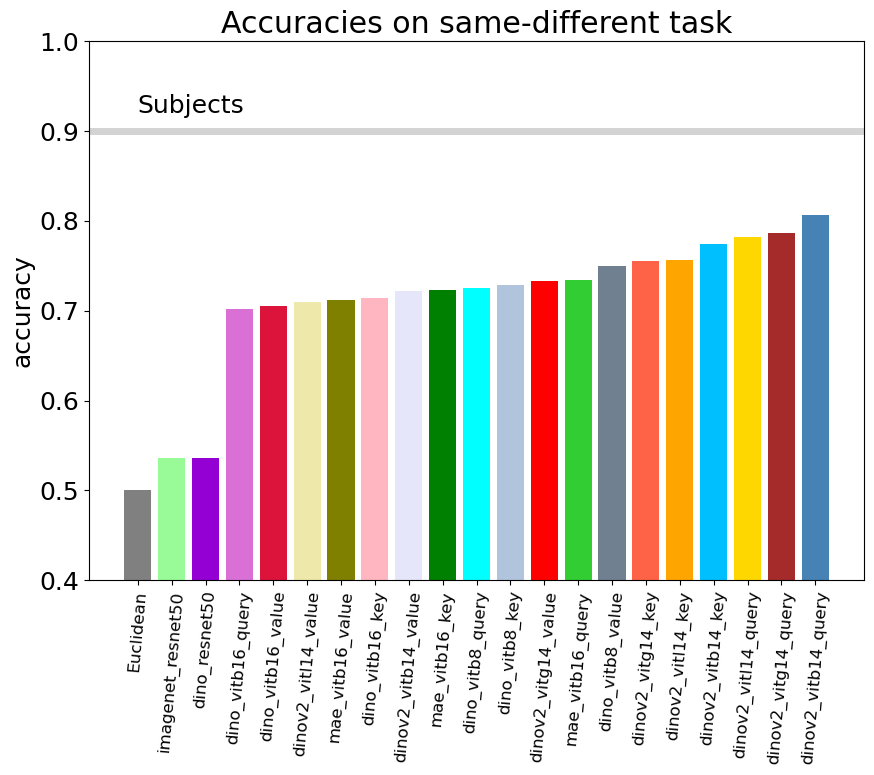

In [17]:


heights = list(df_res_sorted['model_acc'].values) 
bars = list(df_res_sorted['run_name'].values)
colors = list(df_res_sorted['color'].values)
y_pos = range(len(bars))

fig, ax = plt.subplots(figsize=(10, 7))
ax.bar(y_pos, heights, color = colors)
# Rotation of the bars names
plt.xticks(y_pos, bars, rotation=85, fontsize = 12)
ax.set_ylabel('accuracy')
ax.set_title('Accuracies on same-different task')
ax.set_ylim(0.4,1)

ax.axhline(y=sub_acc, color='lightgray', linestyle='-', linewidth=5)

ax.text(0,0.92,'Subjects',rotation=0)

fig.savefig("figures/model_acc_comp_all.png", bbox_inches='tight', dpi=300)

In [18]:
df_res_sorted_grouped = df_res_sorted.groupby(['model_name'], as_index=False).max()

df_res_sorted_grouped = df_res_sorted_grouped.sort_values(by=['model_acc']) 
df_res_sorted
#.max().sort_values(by=['auc_roc'], ascending=False)
# df_res_sorted

,roc_run_name,run_name,color,color_simple,model_name,auc_roc,model_acc,model_human_corr
20,distance,Euclidean,gray,gray,Euclidean,0.000000,0.500000,0.104391
0,imagenet_resnet50_test,imagenet_resnet50,palegreen,palegreen,ImageNet_ResNet50,0.611176,0.536133,0.102727
1,dino_resnet50_test,dino_resnet50,darkviolet,darkviolet,DINO_ResNet50,0.618234,0.536133,0.116228
7,vit_base_test_16_q,dino_vitb16_query,orchid,lightpink,DINO_ViTb16,0.796639,0.702148,0.214559
6,vit_base_test_16_v,dino_vitb16_value,crimson,lightpink,DINO_ViTb16,0.785853,0.705078,0.212488
15,dinov2_vitl14_test_14_v,dinov2_vitl14_value,palegoldenrod,orange,DINOv2_ViTl14,0.784810,0.709961,0.219397
3,mae_vit_base_test_16_v,mae_vitb16_value,olive,green,MAE_ViTb16,0.815837,0.711914,0.217418
5,vit_base_test_16_k,dino_vitb16_key,lightpink,lightpink,DINO_ViTb16,0.796732,0.713867,0.201351
12,dinov2_vitb14_test_14_v,dinov2_vitb14_value,lavender,steelblue,DINOv2_ViTb14,0.769107,0.721680,0.212549
2,mae_vit_base_test_16_k,mae_vitb16_key,green,green,MAE_ViTb16,0.840034,0.722656,0.218501


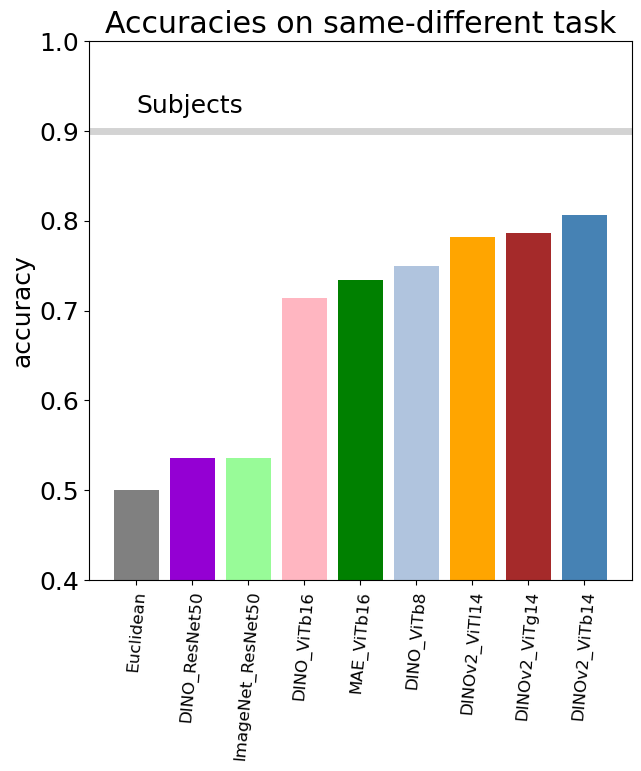

In [19]:


heights = list(df_res_sorted_grouped['model_acc'].values) 
bars = list(df_res_sorted_grouped['model_name'].values)
colors = list(df_res_sorted_grouped['color_simple'].values)
y_pos = range(len(bars))

fig, ax = plt.subplots(figsize=(7, 7))
ax.bar(y_pos, heights, color = colors)
# Rotation of the bars names
plt.xticks(y_pos, bars, rotation=85, fontsize = 12)
ax.set_ylabel('accuracy')
ax.set_title('Accuracies on same-different task')
ax.set_ylim(0.4,1)

ax.axhline(y=sub_acc, color='lightgray', linestyle='-', linewidth=5)

ax.text(0,0.92,'Subjects',rotation=0)

fig.savefig("figures/model_acc_comp_sim.png", bbox_inches='tight', dpi=300)

### plot correlations 

In [20]:
df_res_sorted = df_res_sorted.sort_values(by=['model_human_corr']) 
df_res_sorted

,roc_run_name,run_name,color,color_simple,model_name,auc_roc,model_acc,model_human_corr
0,imagenet_resnet50_test,imagenet_resnet50,palegreen,palegreen,ImageNet_ResNet50,0.611176,0.536133,0.102727
20,distance,Euclidean,gray,gray,Euclidean,0.000000,0.500000,0.104391
1,dino_resnet50_test,dino_resnet50,darkviolet,darkviolet,DINO_ResNet50,0.618234,0.536133,0.116228
8,vit_base_test_8_k,dino_vitb8_key,lightsteelblue,lightsteelblue,DINO_ViTb8,0.768378,0.728516,0.186903
18,dinov2_vitg14_test_14_v,dinov2_vitg14_value,red,brown,DINOv2_ViTg14,0.768288,0.733398,0.189129
17,dinov2_vitg14_test_14_k,dinov2_vitg14_key,tomato,brown,DINOv2_ViTg14,0.806600,0.754883,0.194759
5,vit_base_test_16_k,dino_vitb16_key,lightpink,lightpink,DINO_ViTb16,0.796732,0.713867,0.201351
19,dinov2_vitg14_test_14_q,dinov2_vitg14_query,brown,brown,DINOv2_ViTg14,0.838615,0.786133,0.206474
6,vit_base_test_16_v,dino_vitb16_value,crimson,lightpink,DINO_ViTb16,0.785853,0.705078,0.212488
12,dinov2_vitb14_test_14_v,dinov2_vitb14_value,lavender,steelblue,DINOv2_ViTb14,0.769107,0.721680,0.212549


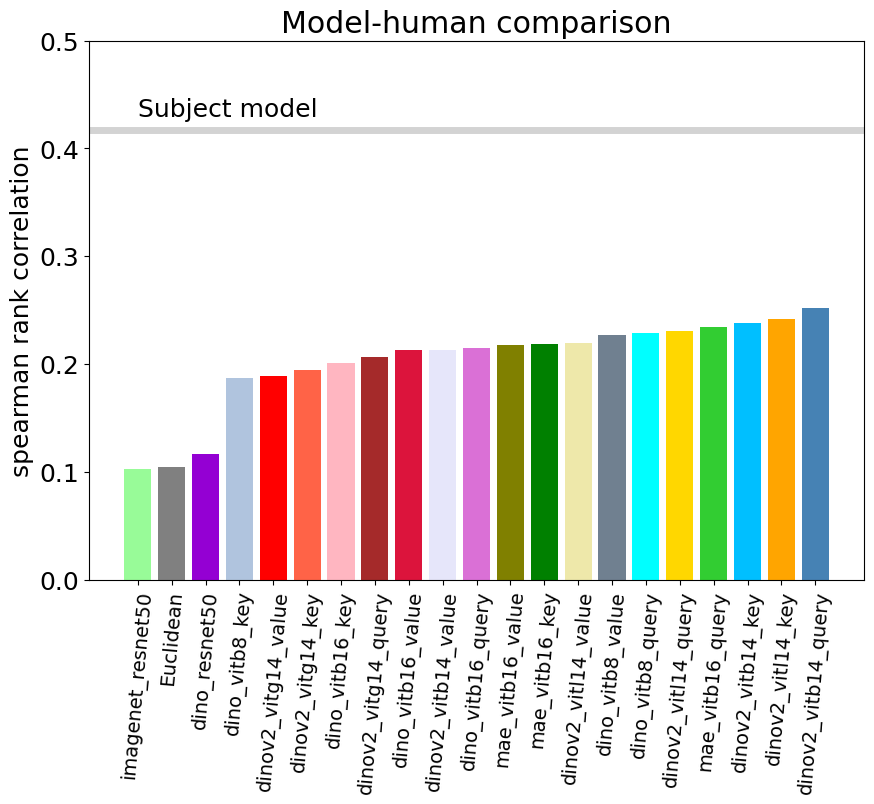

In [30]:
heights = list(df_res_sorted['model_human_corr'].values) 
bars = list(df_res_sorted['run_name'].values)
colors = list(df_res_sorted['color'].values)
y_pos = range(len(bars))
fig, ax = plt.subplots(figsize=(10, 7))
plt.bar(y_pos, heights, color = colors)
# Rotation of the bars names
plt.xticks(y_pos, bars, rotation=85, fontsize = 14)
ax.set_ylabel('spearman rank correlation')
ax.set_title('Model-human comparison')
ax.set_ylim(0,0.5)
plt.axhline(y=sub_sub_corr, color='lightgray', linestyle='-', linewidth=5)

plt.text(0,0.43,'Subject model',rotation=0)

fig.savefig("figures/model_human_rt_comp_all.png", bbox_inches='tight', dpi=300)

In [28]:
df_res_sorted_grouped = df_res_sorted.groupby(['model_name'], as_index=False).max()

df_res_sorted_grouped = df_res_sorted_grouped.sort_values(by=['model_human_corr']) 
df_res_sorted

,roc_run_name,run_name,color,color_simple,model_name,auc_roc,model_acc,model_human_corr
0,imagenet_resnet50_test,imagenet_resnet50,palegreen,palegreen,ImageNet_ResNet50,0.611176,0.536133,0.102727
20,distance,Euclidean,gray,gray,Euclidean,0.000000,0.500000,0.104391
1,dino_resnet50_test,dino_resnet50,darkviolet,darkviolet,DINO_ResNet50,0.618234,0.536133,0.116228
8,vit_base_test_8_k,dino_vitb8_key,lightsteelblue,lightsteelblue,DINO_ViTb8,0.768378,0.728516,0.186903
18,dinov2_vitg14_test_14_v,dinov2_vitg14_value,red,brown,DINOv2_ViTg14,0.768288,0.733398,0.189129
17,dinov2_vitg14_test_14_k,dinov2_vitg14_key,tomato,brown,DINOv2_ViTg14,0.806600,0.754883,0.194759
5,vit_base_test_16_k,dino_vitb16_key,lightpink,lightpink,DINO_ViTb16,0.796732,0.713867,0.201351
19,dinov2_vitg14_test_14_q,dinov2_vitg14_query,brown,brown,DINOv2_ViTg14,0.838615,0.786133,0.206474
6,vit_base_test_16_v,dino_vitb16_value,crimson,lightpink,DINO_ViTb16,0.785853,0.705078,0.212488
12,dinov2_vitb14_test_14_v,dinov2_vitb14_value,lavender,steelblue,DINOv2_ViTb14,0.769107,0.721680,0.212549


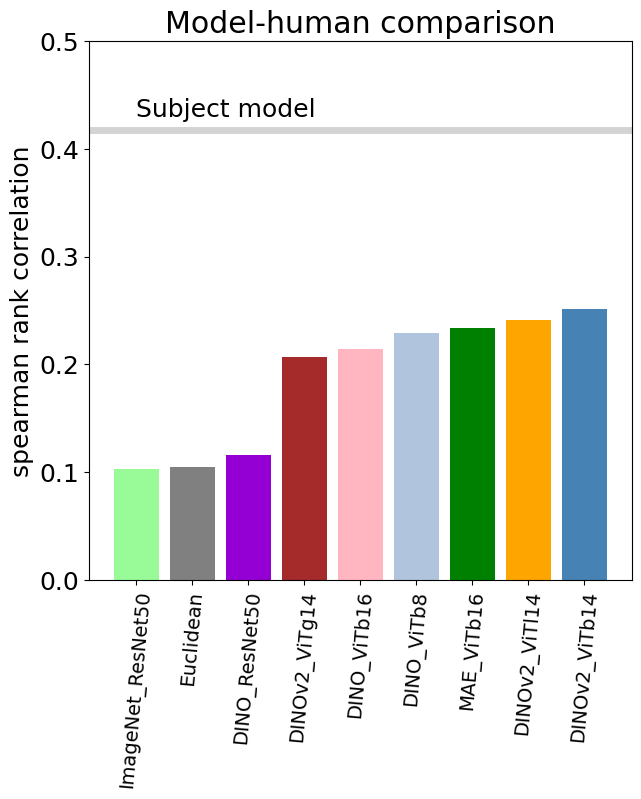

In [29]:
heights = list(df_res_sorted_grouped['model_human_corr'].values) 
bars = list(df_res_sorted_grouped['model_name'].values)
colors = list(df_res_sorted_grouped['color_simple'].values)
y_pos = range(len(bars))
fig, ax = plt.subplots(figsize=(7, 7))
plt.bar(y_pos, heights, color = colors)
# Rotation of the bars names
plt.xticks(y_pos, bars, rotation=85, fontsize = 14)
ax.set_ylabel('spearman rank correlation')
ax.set_title('Model-human comparison')
ax.set_ylim(0,0.5)
plt.axhline(y=sub_sub_corr, color='lightgray', linestyle='-', linewidth=5)

plt.text(0,0.43,'Subject model',rotation=0)

fig.savefig("figures/model_human_rt_comp_sim.png", bbox_inches='tight', dpi=300)

In [34]:
df_res_sorted[['run_name','model_human_corr']]

,run_name,model_human_corr
0,imagenet_resnet50,0.102727
20,Euclidean,0.104391
1,dino_resnet50,0.116228
8,dino_vitb8_key,0.186903
18,dinov2_vitg14_value,0.189129
17,dinov2_vitg14_key,0.194759
5,dino_vitb16_key,0.201351
19,dinov2_vitg14_query,0.206474
6,dino_vitb16_value,0.212488
12,dinov2_vitb14_value,0.212549


### Plot the behavior of a model

In [96]:
exp_name = "dinov2_vitb14_test_14_q_0.8_0.02.npy"
df_comp = df_test.copy()
model_preds = np.load(model_restuls_dir + exp_name) 

df_comp['model_pred'] = list(model_preds)

In [97]:
# plot average RTs for each condition


def beh_summ(dv):
    
    summ_rts = []
    for cf in ['close', 'far']:
        for sd in ['same', 'diff']:

            df_comp_cond = df_comp[(df_comp['close_far']==cf) & (df_comp['same_diff']==sd)]
            #print(sd, cf, df_comp_cond['model_pred'].mean(), df_comp_cond['model_pred'].sem())
            summ =  df_comp_cond[dv].mean(), df_comp_cond[dv].sem()
            summ_rts.append(summ)

            print(sd, cf,summ)

    summ_rts = np.array(summ_rts)
    
    return summ_rts

def plt_summ(summ_rts, ylim):
    
    fig = plt.figure(figsize=(4, 4))

    labels = ['Same', 'Different']
    close_means = summ_rts[0:2,0]
    close_ses = summ_rts[0:2,1]

    far_means = summ_rts[2:4,0]
    far_ses = summ_rts[2:4,1]


    x =np.array([0, 1.5])  # the label locations
    width = 0.5  # the width of the bars

    plt.rcParams.update({'font.size': 18})

    fig, ax = plt.subplots()
    rects1 = ax.bar(x - width/2, close_means, width, label='Close', edgecolor = 'black', color = ['lightgreen', 'lightblue'], yerr=close_ses, capsize=3, hatch='/')

    rects2 = ax.bar(x + width/2, far_means, width, label='Far', edgecolor = 'black', color =['green', 'steelblue'], yerr=far_ses, capsize=3, hatch='/')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Number of model steps')
    ax.set_title('')
    ax.set_xticks(x)  # , labels=labels
    ax.set_xticklabels(labels)
    #ax.legend() 
    ax.set_ylim(ylim) #(35, 60)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # ax.bar_label(rects1, padding=3)
    # ax.bar_label(rects2, padding=3)

    plt.tight_layout()
    plt.show()
    
    fig.savefig("figures/model_steps_q_8_supp.png", bbox_inches='tight', dpi=300)

same close (10.250980392156864, 0.3571095180584539)
diff close (18.470588235294116, 0.24111602401151205)
same far (12.72549019607843, 0.28504986342182204)
diff far (19.180392156862744, 0.18694879705870524)


<Figure size 400x400 with 0 Axes>

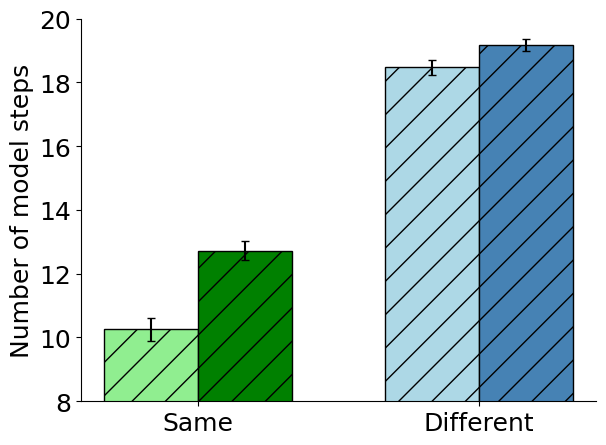

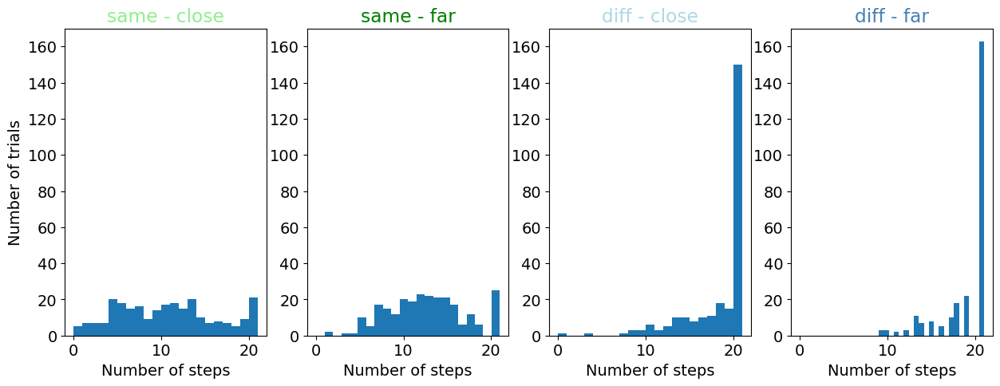

In [98]:
summ_rts = beh_summ('model_pred')
plt_summ(summ_rts, (8,20))

color = ['lightgreen', 'green', 'lightblue', 'steelblue']

plt.rcParams.update({'font.size': 14})

fig = plt.figure(figsize=(15, 5))
# and we add one plot per reference point
gs = fig.add_gridspec(1, 4)
# fig.subplots_adjust(wspace=0.1, hspace=0.5)

ind = 0 
for sd in ['same', 'diff']:
    for cf in ['close', 'far']:

        ax = plt.subplot(gs[0,ind])
        ax.hist(df_comp[(df_comp['close_far']==cf) & (df_comp['same_diff']==sd)]['model_pred'], bins = 21)
        ax.set_title('{} - {}'.format(sd,cf), color =color[ind])
        if ind == 0:
            ax.set_ylabel('Number of trials')
        ax.set_xlabel('Number of steps')
        ax.set_xlim(-1,22)
        ax.set_ylim(0,170)
        ind = ind+1
        
plt.show()

# summ_rts = beh_summ('subs_mean_p')
# plt_summ(summ_rts, (40,60))

fig.savefig("figures/model_steps_hist_q_8_supp.png", bbox_inches='tight', dpi=300)

### plot results

In [2]:
df_test = pd.read_excel("./datasets/dataset_grouping/test_data_grouping_with_mean_beh.xls", index_col=0)  
df_test

,img_id,img_name,same_diff,close_far,first_dot_xy,second_dot_xy,same_object_anns_ind,diff_object_anns_ind,distance,img_shape,subs_mean_rt,subs_mean_p
image_id,,,,,,,,,,,,
16,289393,000000289393.jpg,same,close,"[316, 251]","[210, 276]",2,1,108.908218,"(480, 640, 3)",773.615385,34.473160
16,289393,000000289393.jpg,diff,close,"[316, 251]","[221, 204]",2,1,105.990566,"(480, 640, 3)",917.538462,61.495698
16,289393,000000289393.jpg,same,far,"[316, 251]","[114, 262]",2,1,202.299283,"(480, 640, 3)",716.307692,40.940762
16,289393,000000289393.jpg,diff,far,"[316, 251]","[135, 155]",2,1,204.882893,"(480, 640, 3)",993.176471,65.961102
26,153299,000000153299.jpg,same,close,"[237, 264]","[206, 165]",1,0,103.740060,"(500, 461, 3)",1132.909091,71.109335
...,...,...,...,...,...,...,...,...,...,...,...,...
4971,553788,000000553788.jpg,diff,far,"[317, 181]","[503, 257]",1,2,200.927848,"(363, 640, 3)",816.266667,43.723299
4998,394940,000000394940.jpg,same,close,"[213, 320]","[110, 285]",3,2,108.784190,"(640, 426, 3)",721.083333,31.122659
4998,394940,000000394940.jpg,diff,close,"[213, 320]","[261, 415]",3,2,106.437775,"(640, 426, 3)",955.437500,58.665428


In [3]:
img_ids = df_test['img_id'].unique()
img_ids

array([289393, 153299, 219578, 555705, 443303,  25560, 524456,  95786,
       504711, 459153, 166277, 292082, 134112, 323355, 507223, 187243,
       140640, 291490, 127517, 375278,  98839,  21167, 252776, 286553,
       383386, 458992, 127987, 127955,  70158, 146358, 293625, 147729,
       446651, 227478, 165039, 183716, 360960, 454750,  45550, 497599,
       290843, 488673, 472375, 247917, 361238, 213035, 399205, 481573,
       106757, 183648, 519688, 473974, 306700, 146457, 269196, 243867,
       272364, 138979,  73702,  77595, 476810, 217948, 431848, 453166,
       419974, 213935, 401991,    776,  61471, 360325, 551815, 212573,
        64868, 229216,  58705, 144300, 493284, 116589, 350148, 174371,
       168883, 423506, 377814,   7108,   6771,  37670, 553776, 132796,
         9448, 309938,  25139, 271402, 289059, 462643, 107087, 130826,
       375493,  15497, 416343, 382009, 283717, 468965, 262227,  31817,
       399764, 167128, 407298,  61333,  73533, 448448,   6763, 364166,
      

In [6]:
im_dir = './figures/overlay/supp/'
file_names = os.listdir(im_dir)

d = {'file_name': file_names}
df = pd.DataFrame(data=d)
df

,file_name
0,138979_10_same_close.png
1,361238_12_diff_far.png
2,247917_16_diff_close.png
3,247917_spread.png
4,73533_spread.png
...,...
1273,290833_21_diff_far.png
1274,163117_12_diff_close.png
1275,132587_14_same_far.png
1276,374982_12_same_far.png


443303_21_diff_close.png
443303_spread.png
443303_21_diff_far.png
443303_13_same_close.png
443303_13_same_far.png


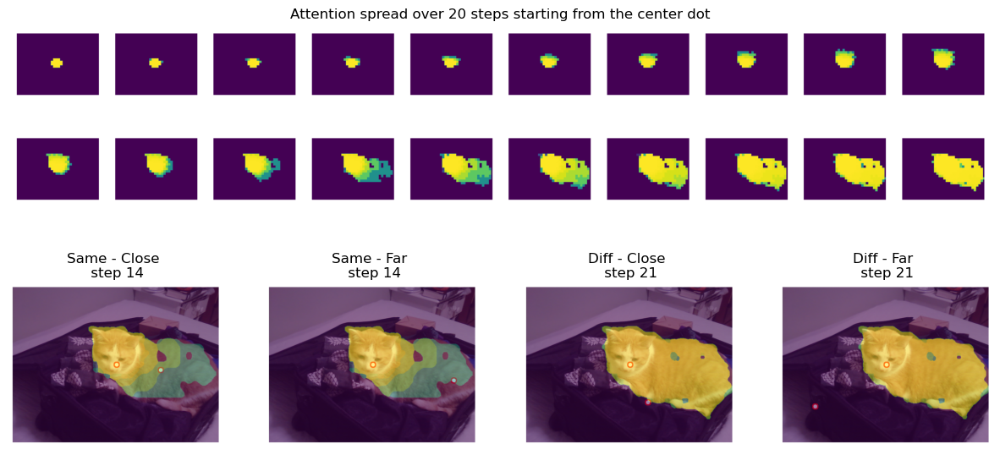

25560_spread.png
25560_4_same_close.png
25560_21_diff_far.png
25560_21_same_far.png
25560_21_diff_close.png


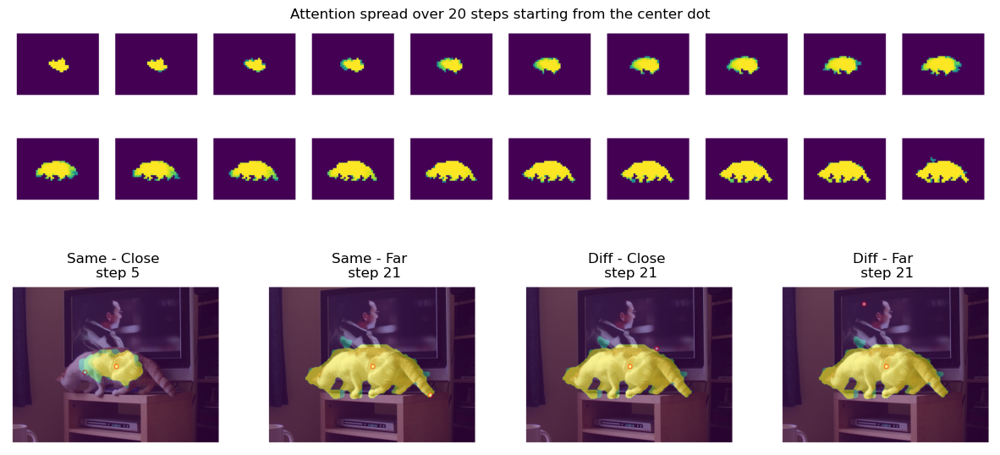

524456_13_same_close.png
524456_21_diff_far.png
524456_spread.png
524456_14_same_far.png
524456_21_diff_close.png


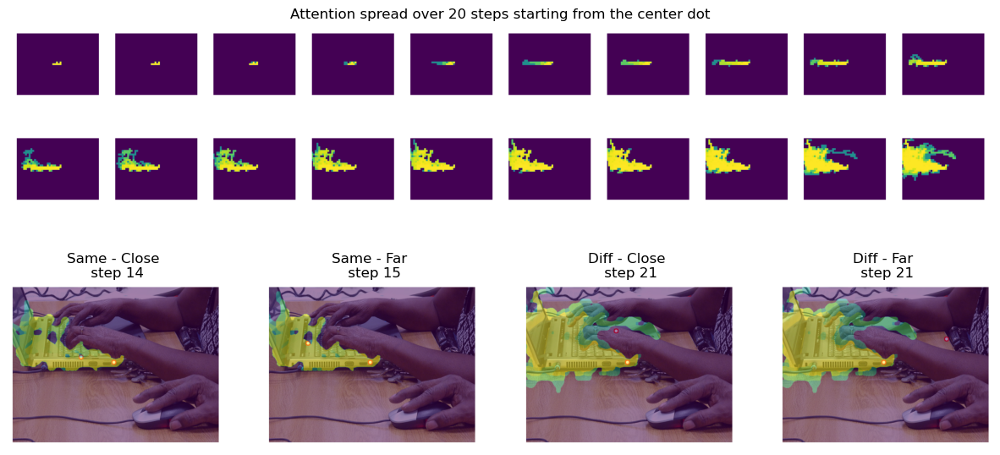

95786_21_diff_close.png
95786_spread.png
95786_13_same_close.png
95786_21_diff_far.png
95786_19_same_far.png


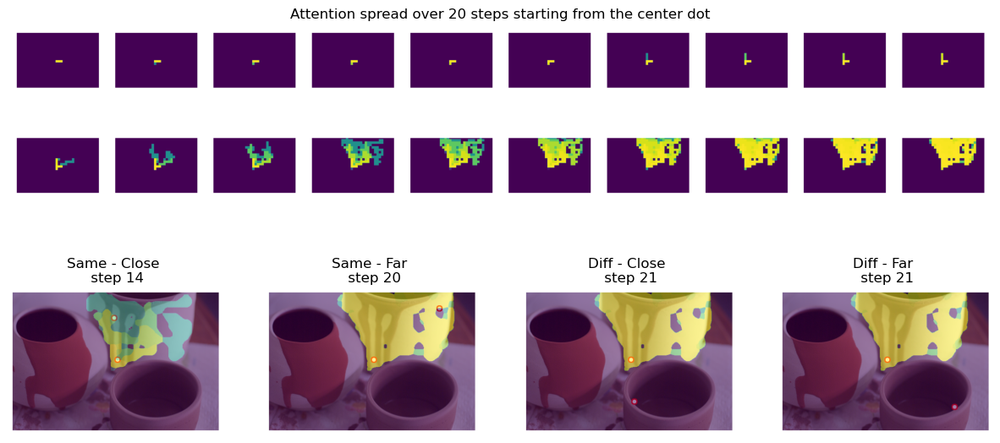

504711_spread.png
504711_7_same_far.png
504711_21_diff_close.png
504711_21_diff_far.png
504711_13_same_close.png


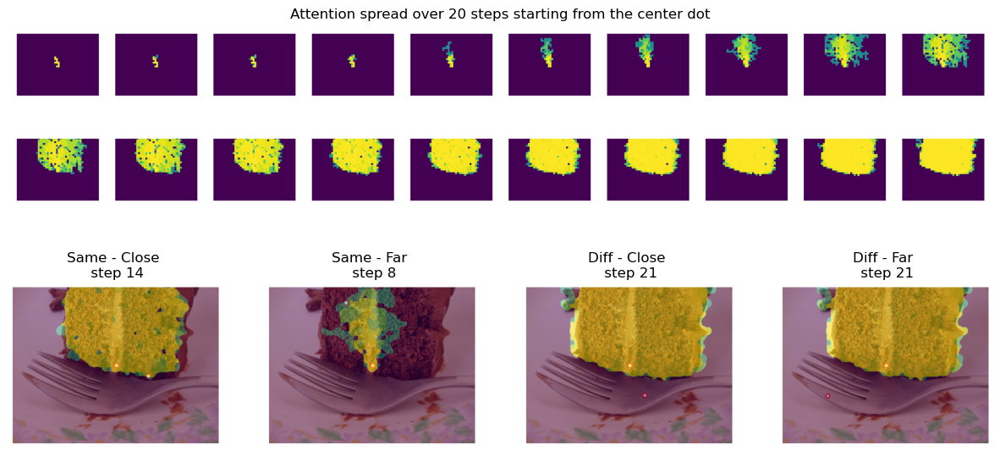

459153_12_same_far.png
459153_21_diff_far.png
459153_13_same_close.png
459153_21_diff_close.png
459153_spread.png


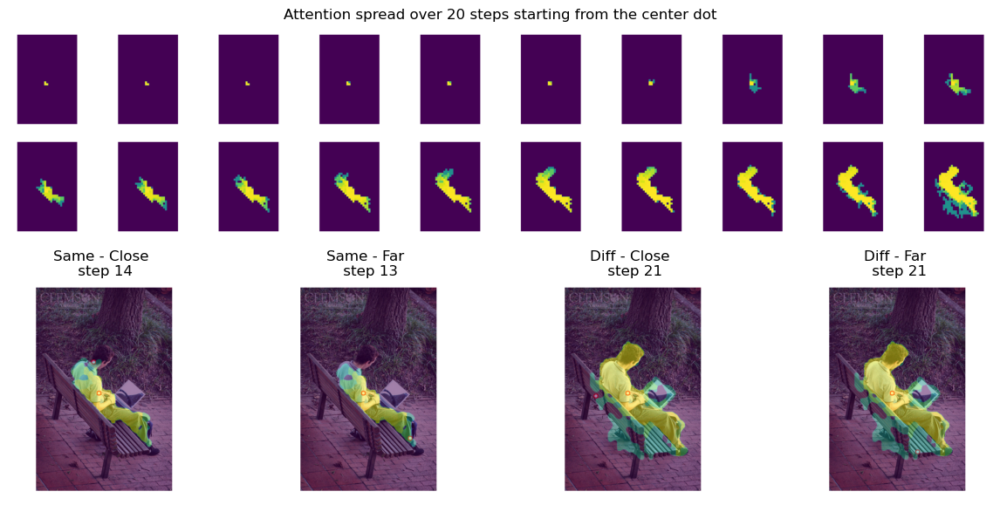

166277_21_diff_close.png
166277_21_diff_far.png
166277_spread.png
166277_10_same_far.png
166277_7_same_close.png


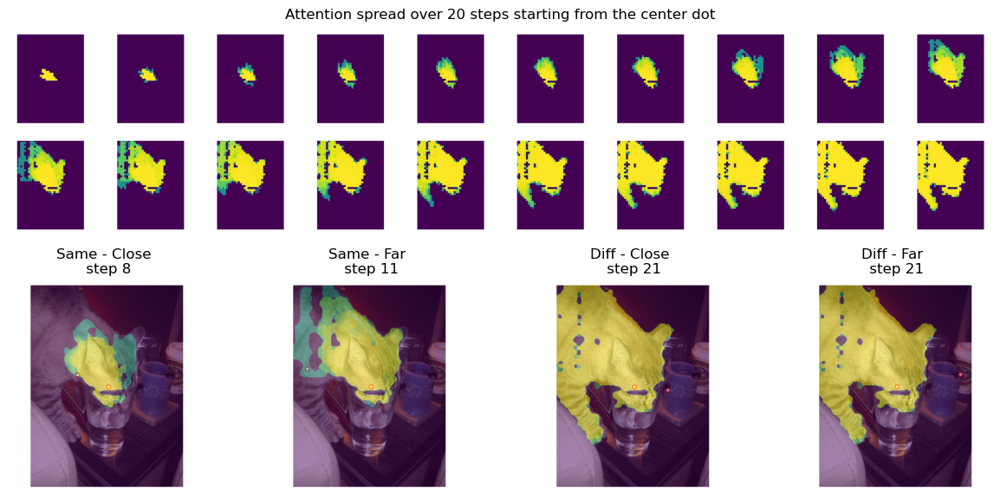

292082_5_same_close.png
292082_8_same_far.png
292082_spread.png
292082_19_diff_close.png
292082_19_diff_far.png


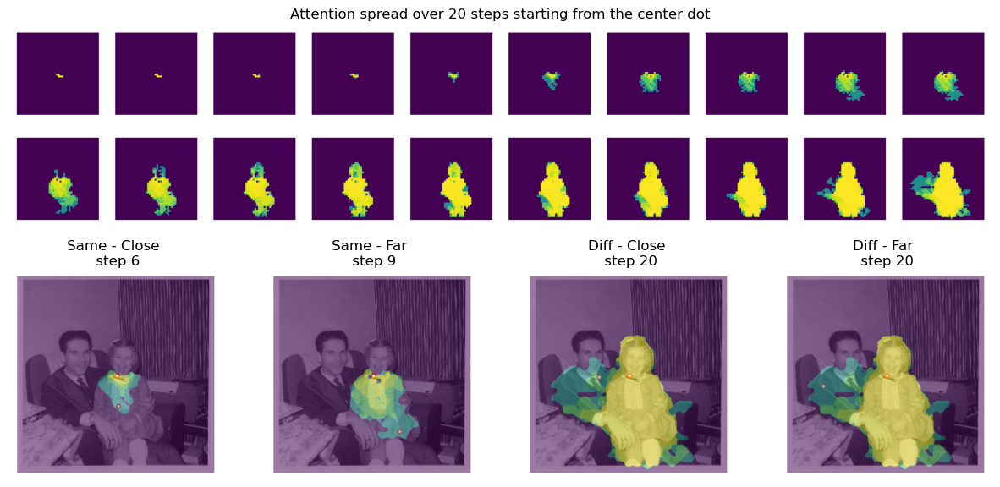

134112_13_same_close.png
134112_14_same_far.png
134112_21_diff_close.png
134112_spread.png
134112_21_diff_far.png


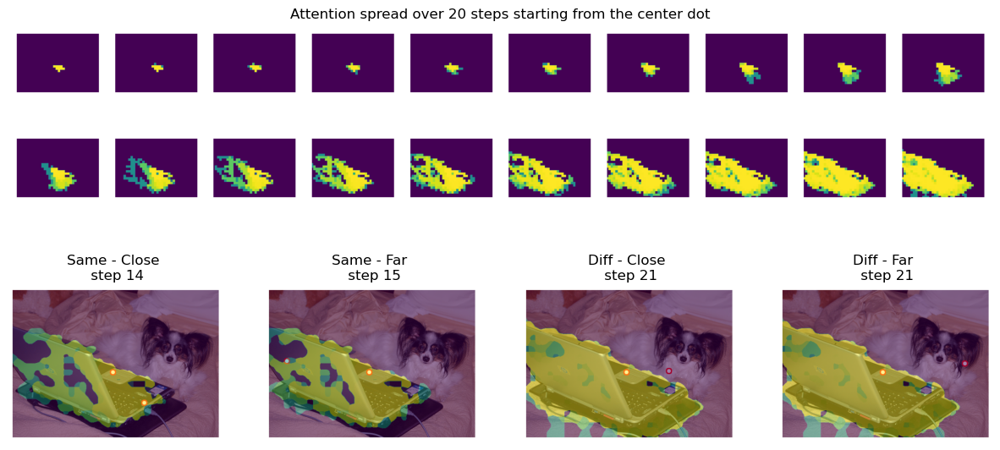

323355_13_same_far.png
323355_spread.png
323355_21_diff_close.png
323355_21_diff_far.png
323355_6_same_close.png


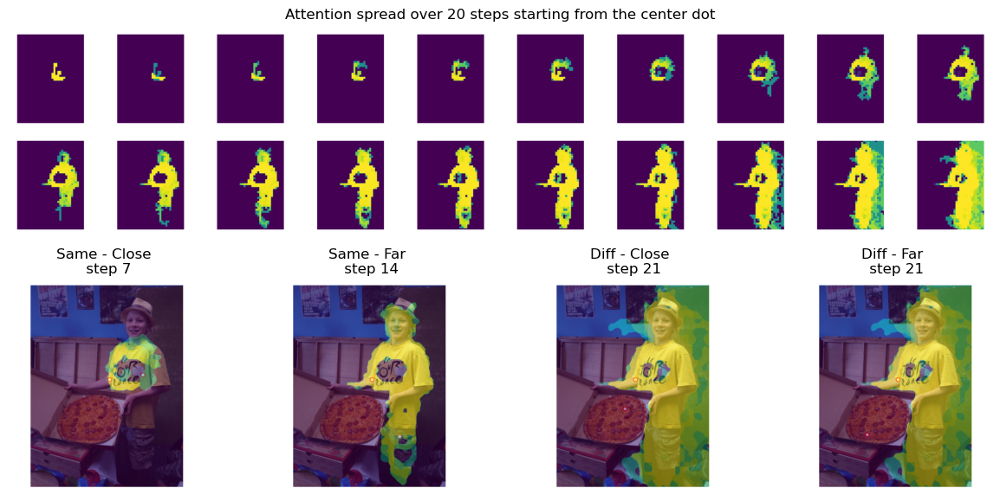

507223_7_same_far.png
507223_spread.png
507223_21_same_close.png
507223_18_diff_far.png
507223_17_diff_close.png


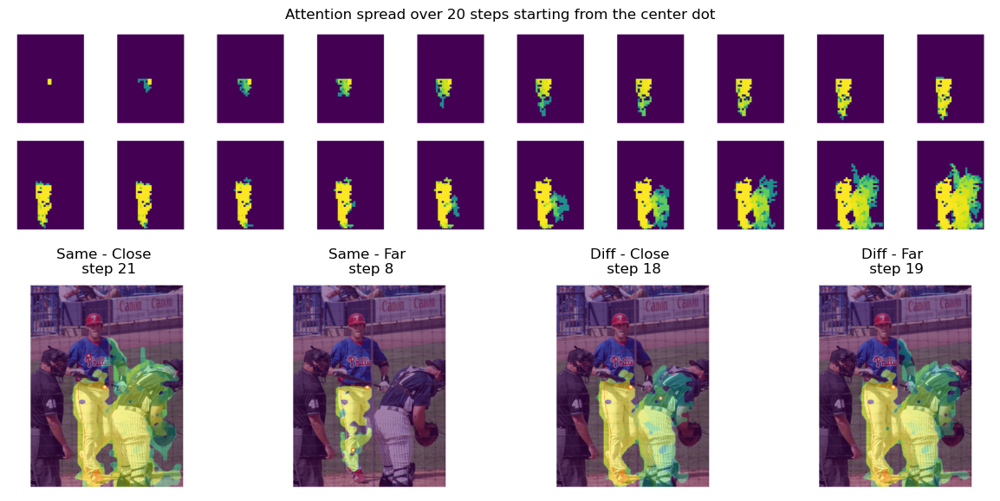

187243_11_same_close.png
187243_21_diff_far.png
187243_21_diff_close.png
187243_spread.png
187243_16_same_far.png


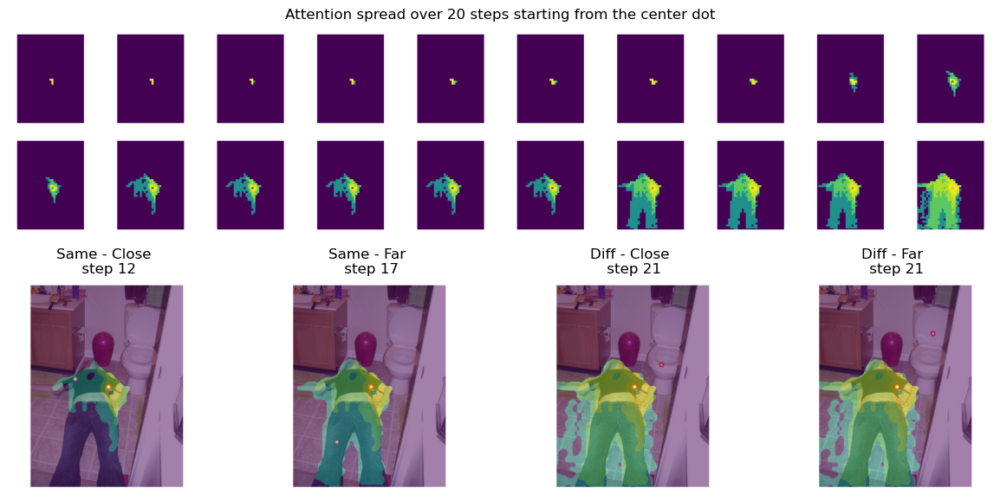

140640_14_same_far.png
140640_spread.png
140640_19_diff_far.png
140640_21_diff_close.png
140640_17_same_close.png


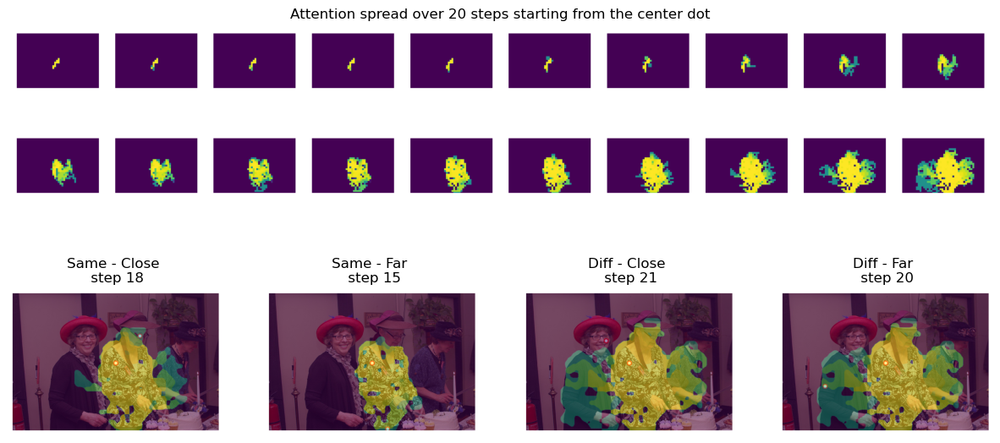

291490_spread.png
291490_21_diff_close.png
291490_14_same_far.png
291490_21_diff_far.png
291490_11_same_close.png


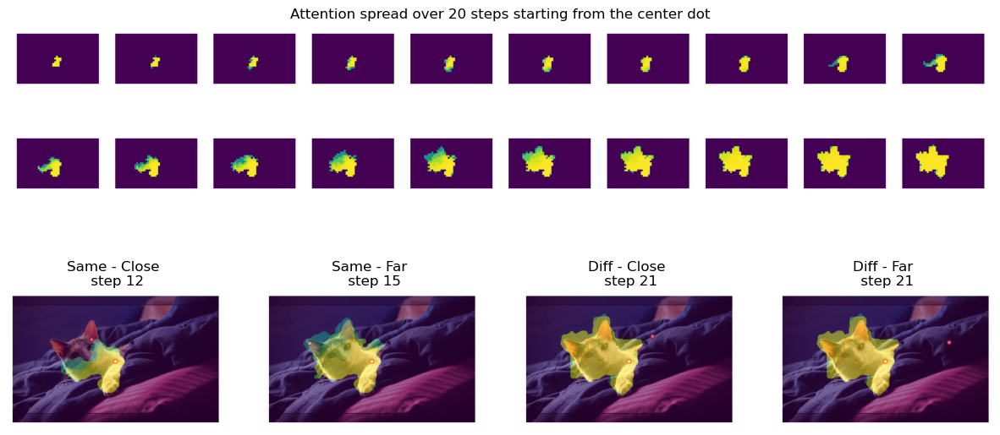

127517_spread.png
127517_12_diff_far.png
127517_10_same_far.png
127517_12_diff_close.png
127517_4_same_close.png


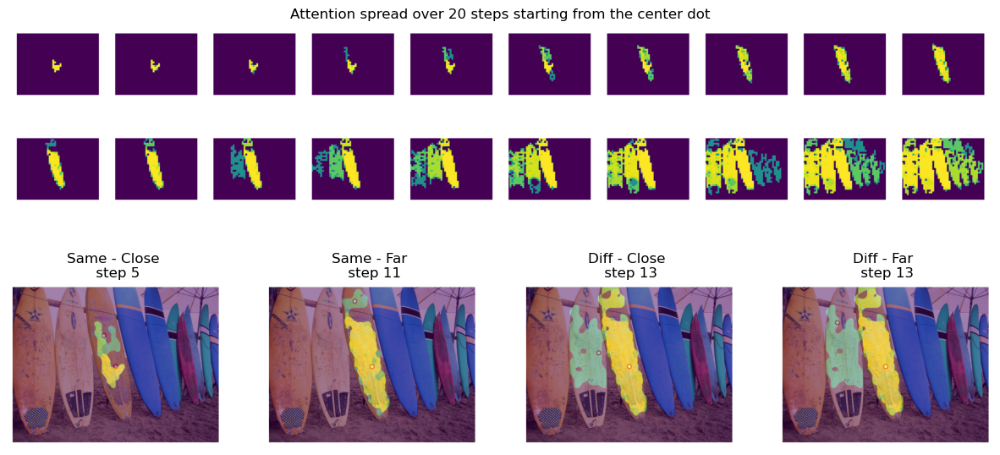

375278_21_diff_far.png
375278_spread.png
375278_18_same_far.png
375278_5_same_close.png
375278_21_diff_close.png


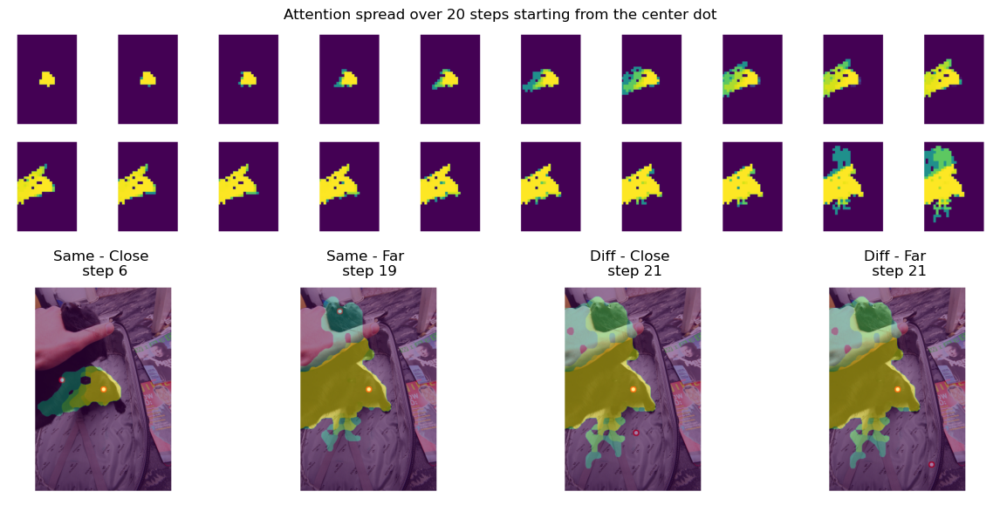

98839_spread.png
98839_4_same_close.png
98839_8_same_far.png
98839_21_diff_far.png
98839_21_diff_close.png


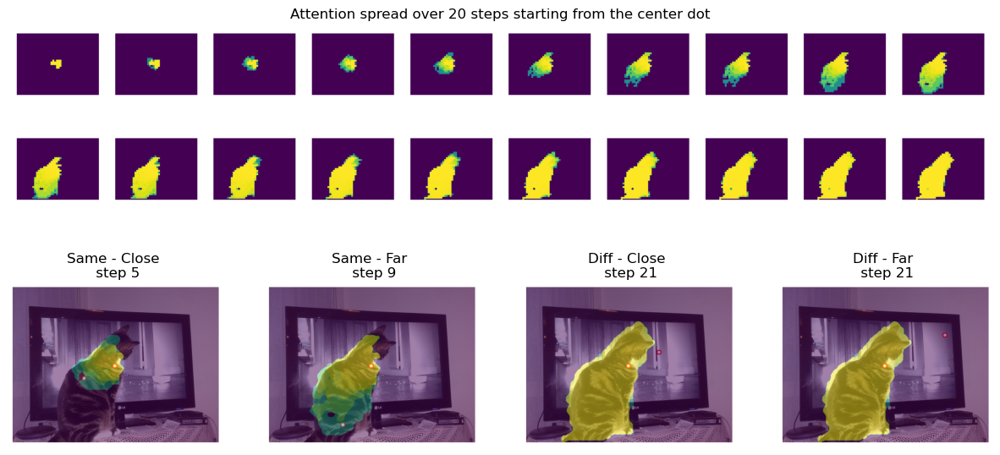

21167_10_same_close.png
21167_spread.png
21167_21_diff_close.png
21167_21_diff_far.png
21167_13_same_far.png


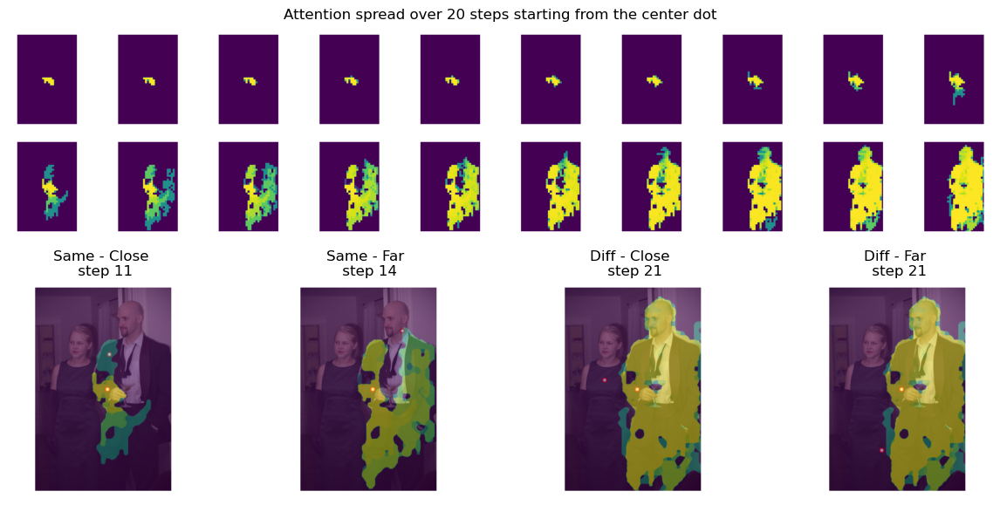

252776_spread.png
252776_21_same_far.png
252776_0_same_close.png
252776_21_diff_far.png
252776_21_diff_close.png


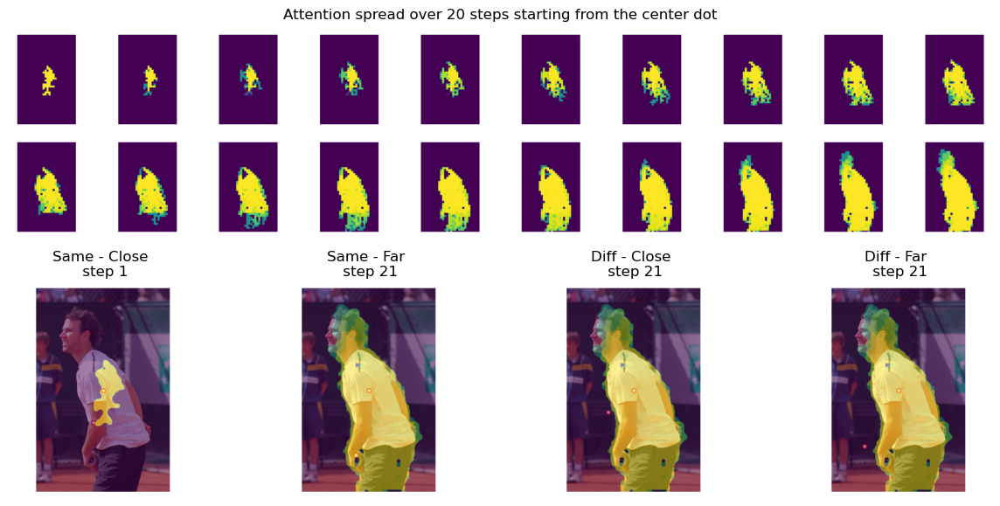

286553_spread.png
286553_6_same_close.png
286553_21_diff_far.png
286553_21_diff_close.png
286553_12_same_far.png


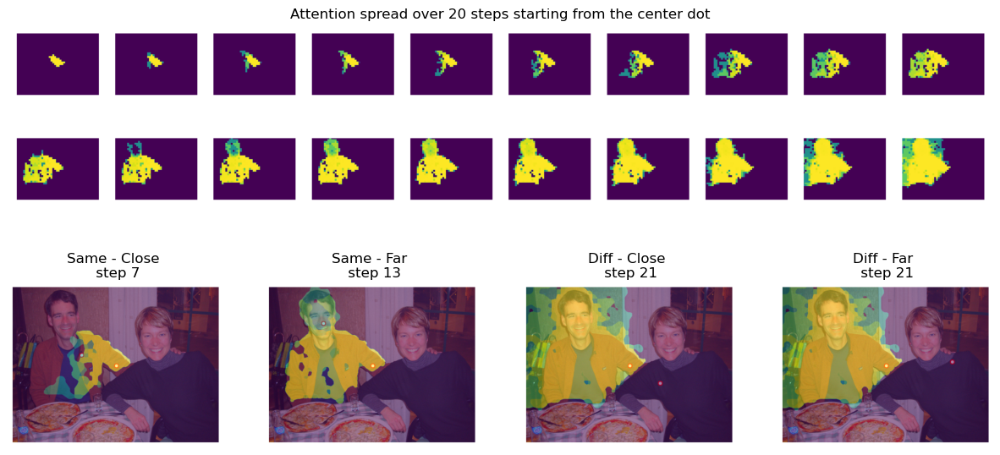

383386_15_same_close.png
383386_12_same_far.png
383386_spread.png
383386_19_diff_far.png
383386_18_diff_close.png


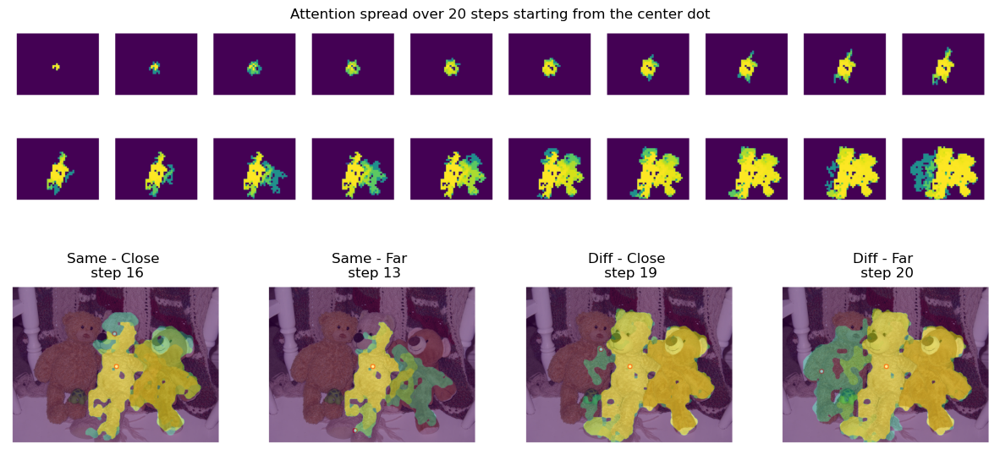

458992_8_same_far.png
458992_21_diff_close.png
458992_spread.png
458992_21_diff_far.png
458992_9_same_close.png


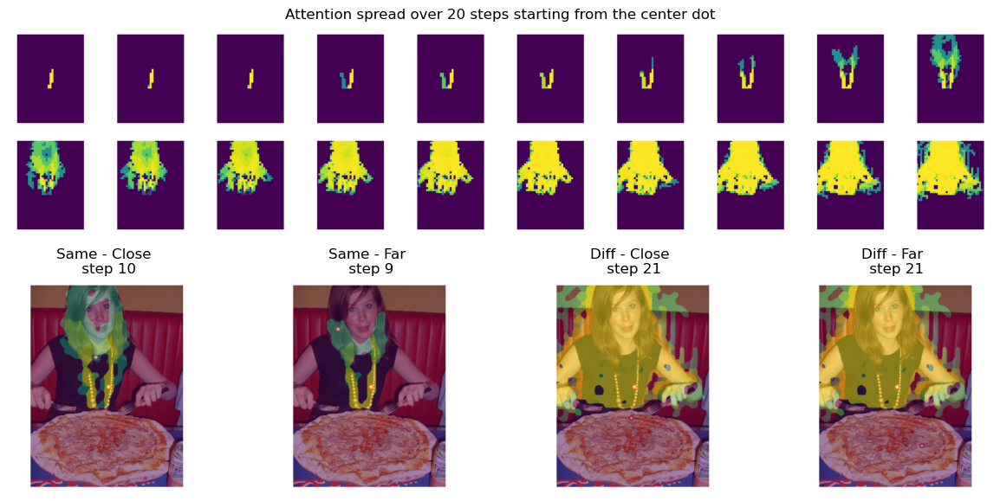

127987_12_same_close.png
127987_spread.png
127987_13_diff_far.png
127987_11_same_far.png
127987_13_diff_close.png


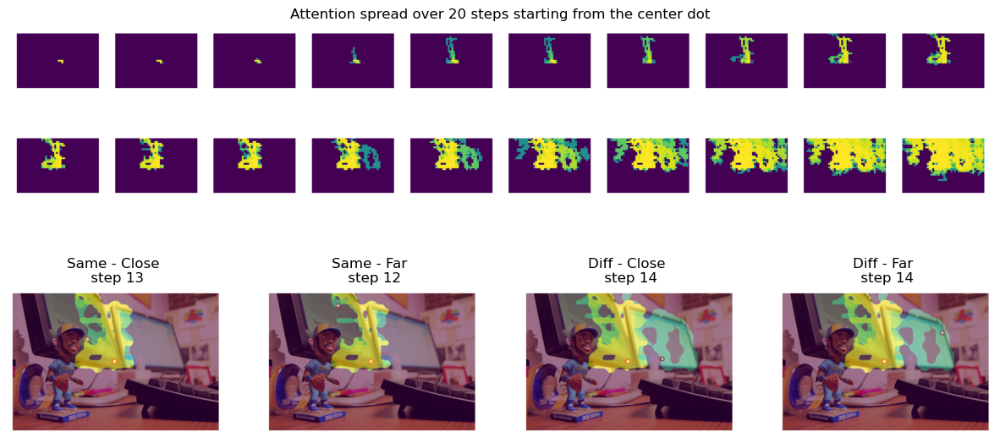

127955_15_diff_far.png
127955_15_same_far.png
127955_spread.png
127955_16_same_close.png
127955_0_diff_close.png


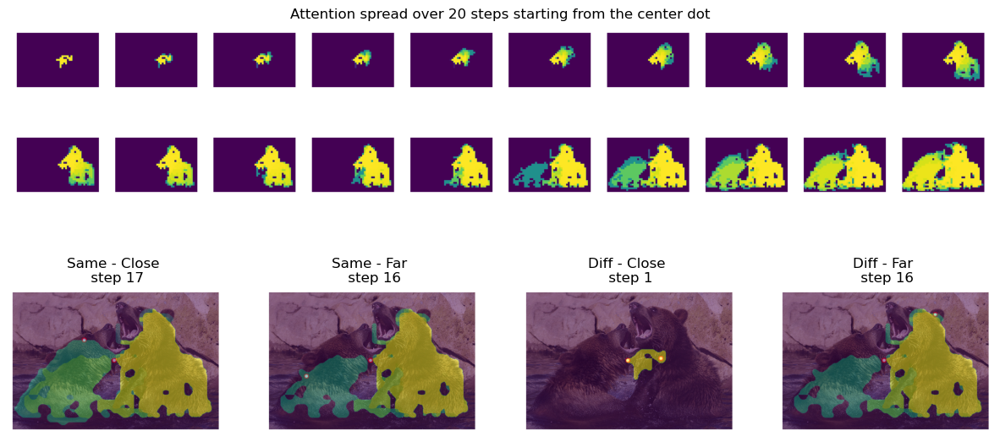

70158_15_same_far.png
70158_7_same_close.png
70158_spread.png
70158_18_diff_far.png
70158_17_diff_close.png


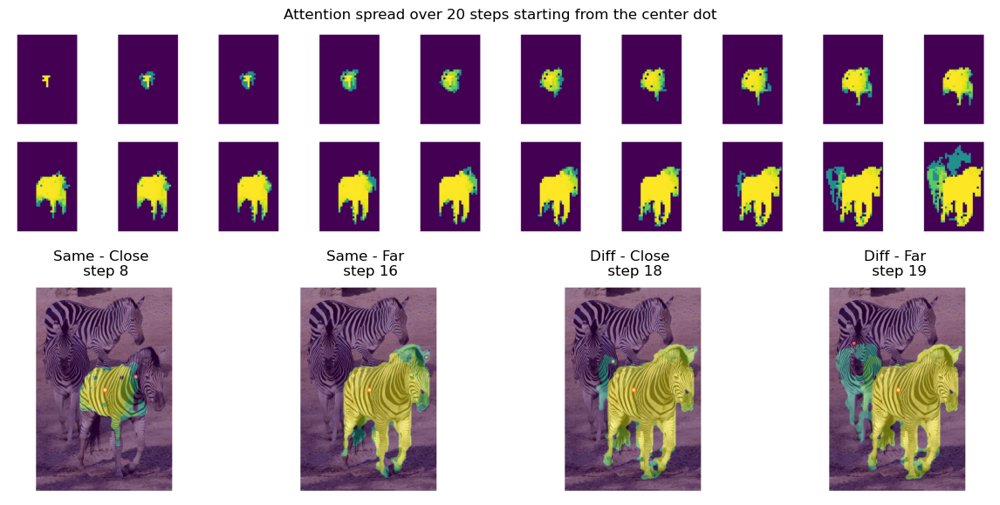

146358_10_same_far.png
146358_18_diff_far.png
146358_5_same_close.png
146358_11_diff_close.png
146358_spread.png


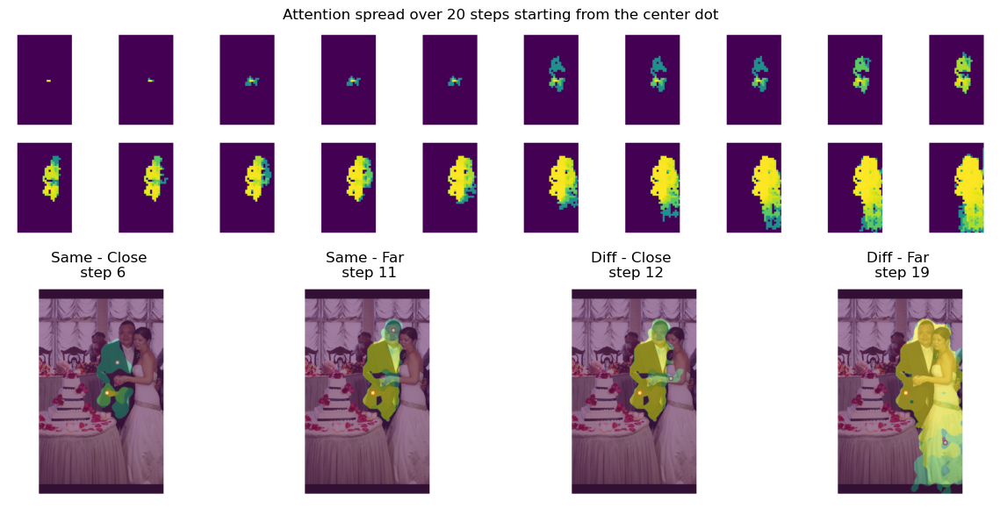

293625_spread.png
293625_19_diff_far.png
293625_16_diff_close.png
293625_13_same_far.png
293625_21_same_close.png


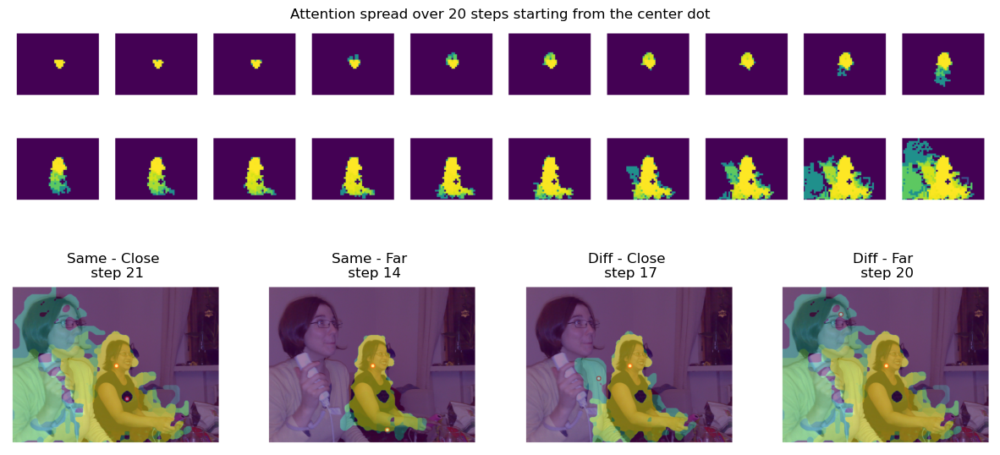

147729_11_same_close.png
147729_18_diff_close.png
147729_spread.png
147729_19_diff_far.png
147729_17_same_far.png


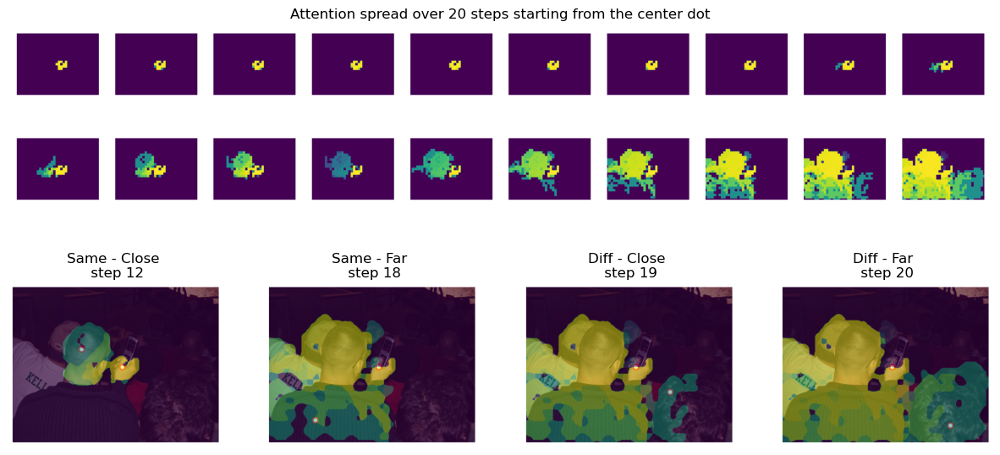

446651_10_same_close.png
446651_spread.png
446651_13_diff_far.png
446651_19_diff_close.png
446651_14_same_far.png


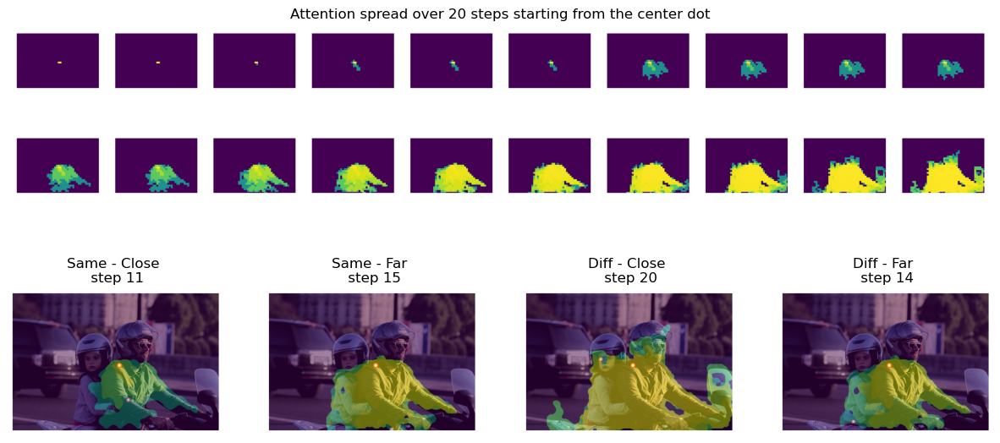

227478_9_diff_far.png
227478_spread.png
227478_7_diff_close.png
227478_11_same_far.png
227478_4_same_close.png


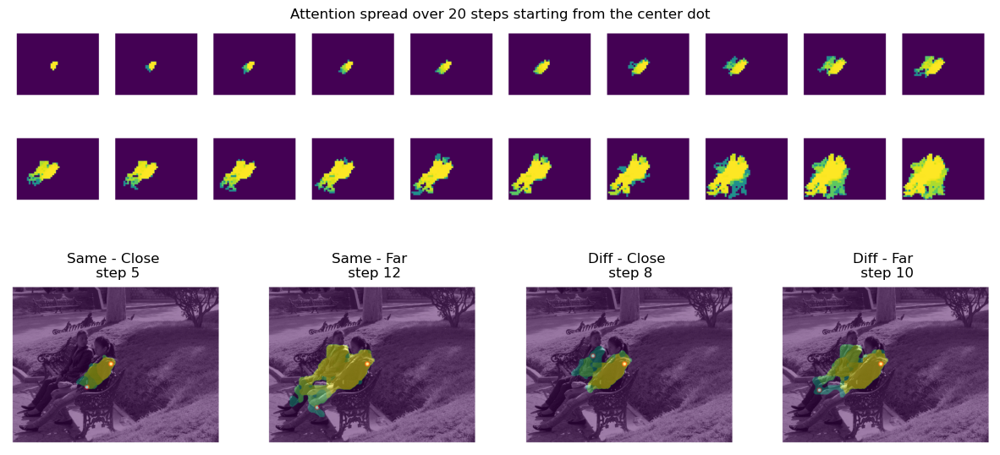

165039_21_diff_far.png
165039_2_same_close.png
165039_spread.png
165039_14_same_far.png
165039_21_diff_close.png


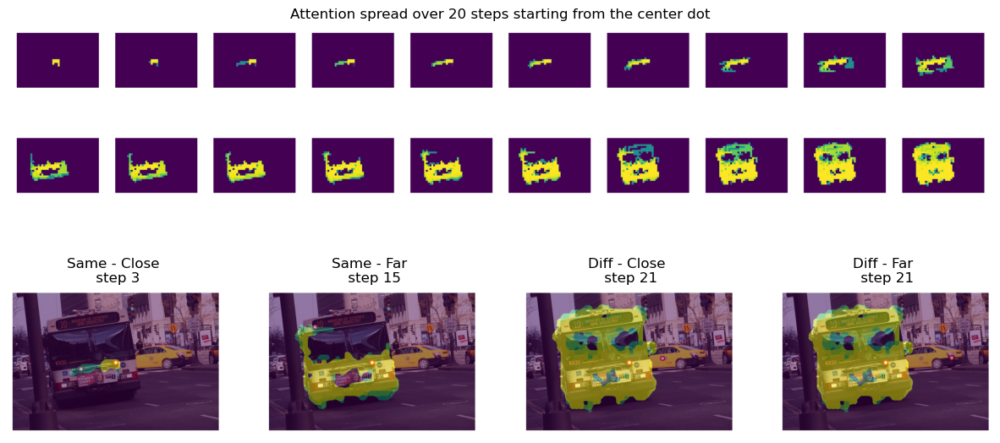

183716_17_diff_close.png
183716_11_same_far.png
183716_21_diff_far.png
183716_spread.png
183716_12_same_close.png


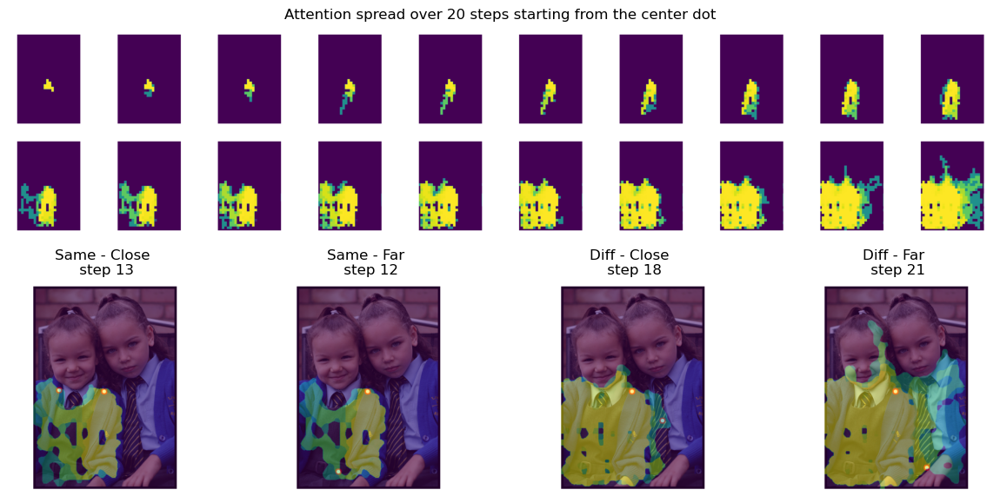

360960_spread.png
360960_19_diff_far.png
360960_5_same_close.png
360960_8_same_far.png
360960_16_diff_close.png


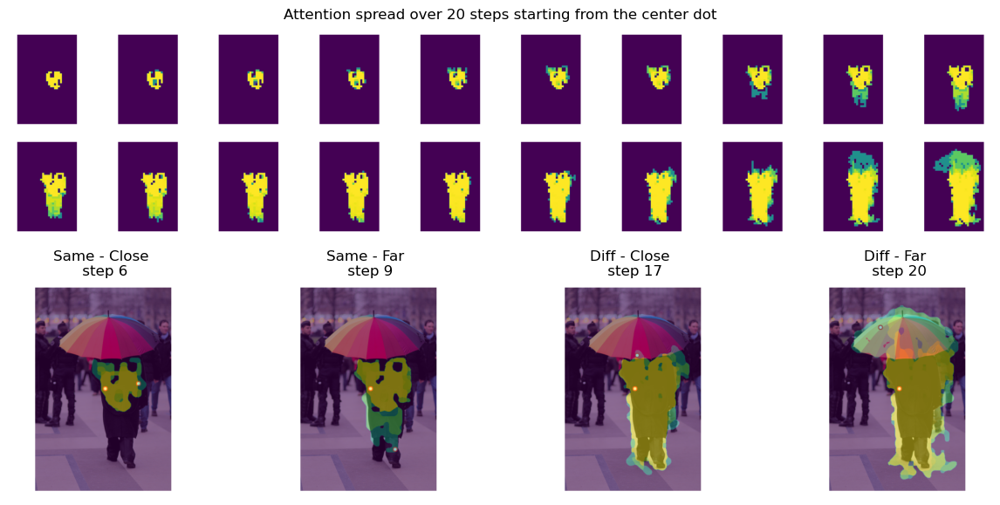

454750_21_diff_close.png
454750_6_same_close.png
454750_spread.png
454750_6_same_far.png
454750_21_diff_far.png


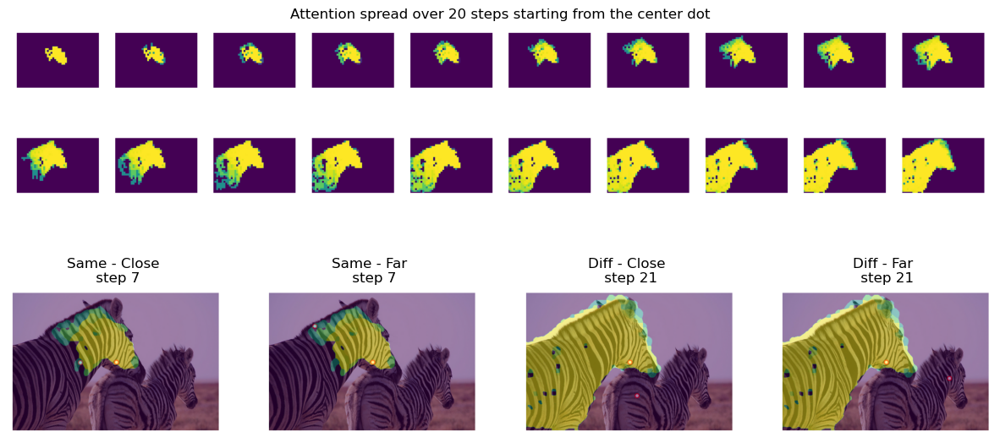

45550_spread.png
45550_21_diff_far.png
45550_12_same_close.png
45550_21_diff_close.png
45550_7_same_far.png


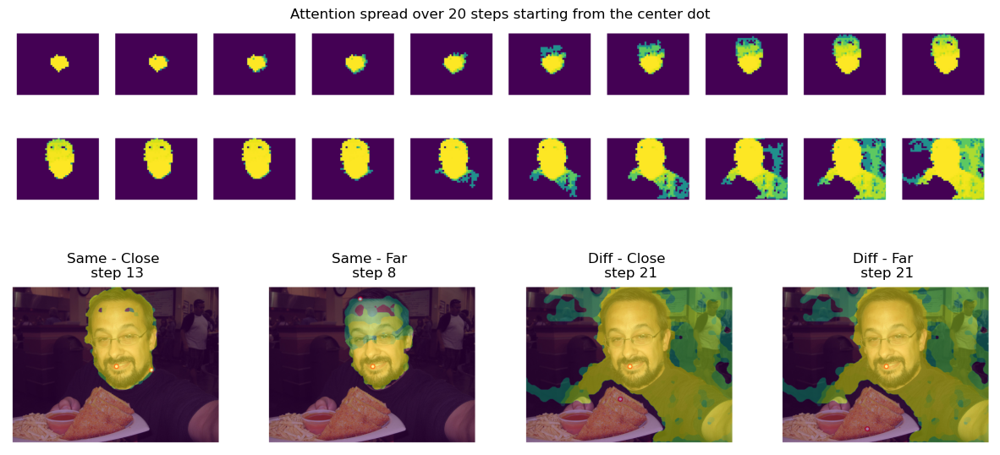

497599_21_diff_close.png
497599_15_same_far.png
497599_14_same_close.png
497599_21_diff_far.png
497599_spread.png


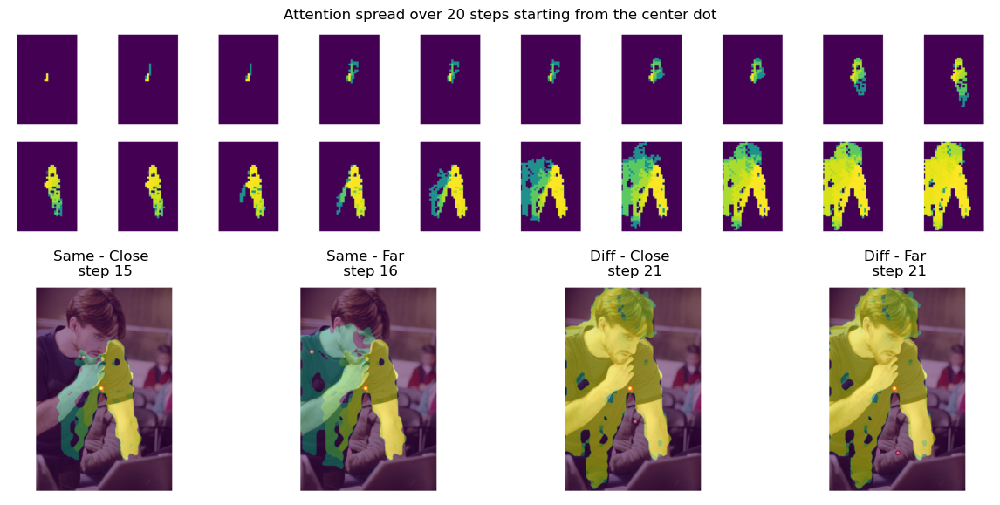

In [7]:
from PIL import Image

for i in range(4,40):
    
    img_id = img_ids[i]
    df_img = df[df['file_name'].str.contains(str(img_id))]

    steps_all_four = np.zeros(4).astype(int)

    for t in range(len(df_img)):
        file = df_img['file_name'].iloc[t] 
        print(file)
        if len(file.split('.')[0].split('_')) >2:
            img_id, step, sd, cf = file.split('.')[0].split('_')

            if sd == 'same':
                if cf == 'close':
                    steps_all_four[0] = int(step) #min(int(step), 20)
                else:
                    steps_all_four[1] = int(step) #min(int(step), 20)
            else:
                if cf == 'close':
                    steps_all_four[2] = int(step) #min(int(step), 20)
                else:
                    steps_all_four[3] = int(step) #min(int(step), 20)

    fig = plt.figure(figsize=(15, 7))
    # and we add one plot per reference point
    gs = fig.add_gridspec(2, 4)
    # fig.subplots_adjust(wspace=0.1, hspace=0.5)

    ax = fig.add_subplot(gs[0, :])
    spread_im = Image.open(im_dir+f'{img_id}_spread.png')
    ax.imshow(spread_im)
    plt.title('Attention spread over 20 steps starting from the center dot')
    plt.axis('off')

    # identical to ax1 = plt.subplot(gs.new_subplotspec((0, 0), colspan=3))
    ax = fig.add_subplot(gs[1, 0])
    overlay_im = Image.open(im_dir+f'{img_id}_{steps_all_four[0]}_same_close.png')
    ax.imshow(overlay_im)
    plt.title(f'Same - Close \n step {min(20,steps_all_four[0])+1}')
    plt.axis('off')

    ax = fig.add_subplot(gs[1, 1])
    overlay_im = Image.open(im_dir+f'{img_id}_{steps_all_four[1]}_same_far.png')
    ax.imshow(overlay_im)
    plt.title(f'Same - Far \n step {min(20,steps_all_four[1])+1}')
    plt.axis('off')

    ax = fig.add_subplot(gs[1, 2])
    overlay_im = Image.open(im_dir+f'{img_id}_{steps_all_four[2]}_diff_close.png')
    ax.imshow(overlay_im)
    plt.title(f'Diff - Close \n step {min(20,steps_all_four[2])+1}')
    plt.axis('off')

    ax = fig.add_subplot(gs[1, 3])
    overlay_im = Image.open(im_dir+f'{img_id}_{steps_all_four[3]}_diff_far.png')
    ax.imshow(overlay_im)
    plt.title(f'Diff - Far \n step {min(20,steps_all_four[3])+1}')
    plt.axis('off')

    plt.show()

    #fig.savefig(f'./figures/overlay/supp/organized/{img_id}.png', bbox_inches='tight', dpi=300)


### 































